<a id='top'></a>

<div style="background-color: #f8f9fa; padding: 20px; border: 1px solid #dee2e6; border-radius: 10px;">

# 📑 Índice de Contenidos
---

1. [**Carga y análisis descriptivo inicial**](#seccion-1)
    - [Importamos archivo loader.py](#1-1)
    - [Análisis estadístico descriptivo](#1-2)
    - [Análisis y limpieza de nulos](#1-3)
    - [Agregación diaria de datos](#1-4)
2. [**Análisis exploratorio de datos**](#seccion-2)
    - [Visualizaciones exploratorias](#2-1)
    - [Selección de features](#2-2)
    - [Normalización de los datos](#2-3)
3. [**Generación datos sintéticos**](#seccion-3)
    - [Simulación basada en física agrícola](#3-1)
    - [Bootstrapping estacional](#3-2)
    - [Datos sinteticos vs datos reales](#3-3)    
    - [Ejecución técnicas de generación](#3-4)
    - [Guardar e Importar datos](#3-5)
4. [**Desarrollo de Modelos**](#seccion-4)
    - [Importación de librerias](#4-1)
    - [Configuración de parámetros de entrenamiento](#4-2)
    - [Wrappers de modelos](#4-3)
        - [Wrapper de SARIMA](#4-4)
        - [Wrapper de SARIMAX](#4-5)
        - [Wrapper de VAR](#4-6)
        - [Wrapper de LSTM](#4-7)
    - [Carga datos sintéticos + reales](#4-8)
    - [Preprocesador personalizado](#4-9)
    - [División entrenamiento y test](#4-10)
    - [Creación de pipelines](#4-11)
5. [**Entrenamiento y Evaluación**](#seccion-5)
    - [Visualización de resultados](#5-1)
6. [**Cálculo Necesidad de riego y RDC**](#seccion-6)
    - [Cálculo de ET0](#6-1)
    - [Pasos para cálcular curva Kc](#6-2)
    - [Cálculo de Kc_ini](#6-3)
    - [Cálculo de Kc_mid](#6-4)
    - [Cálculo de Kc_end](#6-5)
    - [Construcción gáfica de Kc](#6-6)
    - [Cálculo ETc](#6-7)
    - [Cálculo necesidades de riego](#6-8)
    - [Cálculo Riego Deficitario Controlado](#6-9)
6. [**Conclusiones**](#seccion-7)

---

*Utiliza los enlaces para navegar rápidamente.*
</div>

<a id='seccion-1'></a>

# Carga y análisis descriptivo inicial

[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

<br>

---

<a id='1-1'></a>
## Importamos archivo loader.py (importa los datos)
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---


In [1]:
%run loader.py
import matplotlib.pyplot as plt
import numpy as np


In [2]:
display(climate_data)
display(soil_mini1_data)
display(soil_mini2_data)

,Fecha,Índice de calor,Humedad relativa,Presión de vapor,Radiación solar,Temperatura,Punto de rocío,Temperatura del bulbo húmedo,Velocidad del viento,Racha de viento máxima,Dirección del viento,Humectación en hoja (porcentaje),Presión atmosférica,Precipitaciones
0,2023-01-01 00:00:00,11.6,51.0,14.160000,0.0,11.6,1.720000,7.280329,10.0,17.0,180.0,0.0,940.6,0.0
1,2023-01-01 00:15:00,11.2,52.0,13.810000,0.0,11.2,1.620000,7.038901,7.0,10.0,225.0,0.0,940.8,0.0
2,2023-01-01 00:30:00,11.1,58.0,13.720000,0.0,11.1,3.070000,7.501979,7.0,12.0,180.0,0.0,940.8,0.0
3,2023-01-01 00:45:00,11.7,54.0,14.250000,0.0,11.7,2.620000,7.646474,13.0,19.0,180.0,0.0,940.7,0.0
4,2023-01-01 01:00:00,11.3,56.0,13.890000,0.0,11.3,2.760000,7.491661,11.0,20.0,180.0,0.0,940.8,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96996,2025-10-08 22:45:00,15.4,80.0,17.955096,0.0,15.4,11.937903,13.471570,6.0,10.0,22.5,0.0,939.7,0.0
96997,2025-10-08 23:00:00,15.3,80.0,17.844727,0.0,15.3,11.840378,13.377991,6.0,12.0,315.0,0.0,940.0,0.0
96998,2025-10-08 23:15:00,15.2,80.0,17.734961,0.0,15.2,11.742854,13.284236,5.0,10.0,45.0,0.0,940.1,0.0
96999,2025-10-08 23:30:00,15.2,80.0,17.734961,0.0,15.2,11.742854,13.284323,6.0,12.0,0.0,0.0,940.2,0.0


,Fecha,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm)
0,2023-01-01 00:00:00,14.0,29.5,30.7,33.9,66.580874,10.8,10.8,11.4,11.4
1,2023-01-01 00:15:00,14.0,29.5,30.7,33.9,66.580874,10.7,10.8,11.4,11.4
2,2023-01-01 00:30:00,14.0,29.5,30.7,33.9,66.580874,10.6,10.8,11.4,11.4
3,2023-01-01 00:45:00,14.0,29.5,30.7,33.9,66.580874,10.6,10.8,11.4,11.4
4,2023-01-01 01:00:00,13.9,29.5,30.7,33.9,66.543074,10.6,10.8,11.4,11.4
...,...,...,...,...,...,...,...,...,...,...
89883,2025-10-08 22:45:00,28.7,27.6,31.1,32.7,67.305117,18.6,18.8,18.4,17.9
89884,2025-10-08 23:00:00,28.7,27.6,31.1,32.7,67.267317,18.5,18.8,18.4,17.9
89885,2025-10-08 23:15:00,28.6,27.6,31.1,32.7,67.167317,18.4,18.7,18.4,17.9
89886,2025-10-08 23:30:00,28.6,27.6,31.1,32.7,67.167317,18.3,18.6,18.4,17.9


,Fecha,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm)
0,2023-01-01 00:00:00,20.3,25.0,21.9,21.7,47.413496,9.9,10.6,11.4,11.6
1,2023-01-01 00:15:00,20.3,25.0,21.9,21.7,47.413496,9.9,10.6,11.4,11.6
2,2023-01-01 00:30:00,20.3,25.0,21.9,21.7,47.413496,9.9,10.6,11.4,11.6
3,2023-01-01 00:45:00,20.3,25.0,21.9,21.7,47.413496,9.9,10.6,11.4,11.6
4,2023-01-01 01:00:00,20.3,25.0,21.9,21.7,47.413496,9.9,10.6,11.4,11.6
...,...,...,...,...,...,...,...,...,...,...
83359,2025-10-08 22:45:00,25.4,24.4,25.8,18.8,53.913496,18.7,19.2,19.2,18.7
83360,2025-10-08 23:00:00,25.4,24.4,25.8,18.8,53.913496,18.6,19.1,19.2,18.7
83361,2025-10-08 23:15:00,25.4,24.4,25.8,18.8,53.913496,18.5,19.1,19.2,18.7
83362,2025-10-08 23:30:00,25.3,24.4,25.8,18.8,53.813496,18.4,19.1,19.2,18.7


<br>

---
<a id='1-2'></a>
### Análisis estadístico descriptivo del conjunto de datos 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [3]:
climate_data.info()
soil_mini1_data.info()
soil_mini2_data.info()


display(climate_data.describe())
display(soil_mini1_data.describe())
display(soil_mini2_data.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97001 entries, 0 to 97000
Data columns (total 14 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Fecha                             97001 non-null  datetime64[ns]
 1   Índice de calor                   97001 non-null  float64       
 2   Humedad relativa                  96993 non-null  float64       
 3   Presión de vapor                  96993 non-null  float64       
 4   Radiación solar                   96993 non-null  float64       
 5   Temperatura                       96993 non-null  float64       
 6   Punto de rocío                    96993 non-null  float64       
 7   Temperatura del bulbo húmedo      97001 non-null  float64       
 8   Velocidad del viento              96993 non-null  float64       
 9   Racha de viento máxima            96993 non-null  float64       
 10  Dirección del viento              96993 non-nu

,Fecha,Índice de calor,Humedad relativa,Presión de vapor,Radiación solar,Temperatura,Punto de rocío,Temperatura del bulbo húmedo,Velocidad del viento,Racha de viento máxima,Dirección del viento,Humectación en hoja (porcentaje),Presión atmosférica,Precipitaciones
count,97001,97001.000000,96993.000000,96993.000000,96993.000000,96993.000000,96993.000000,97001.000000,96993.000000,96993.000000,96993.000000,96993.000000,96993.000000,96993.000000
mean,2024-05-20 21:54:30.232265472,13.406654,72.922036,18.185691,151.018929,13.456638,7.688319,10.328257,4.829936,8.689256,121.355665,2.236409,936.781740,0.012320
min,2023-01-01 00:00:00,-8.200000,7.000000,3.680000,0.000000,-8.200000,-16.910000,-8.492907,0.000000,0.000000,0.000000,0.000000,904.700000,0.000000
25%,2023-09-10 17:00:00,7.200000,58.000000,10.670000,0.000000,7.200000,3.970000,6.097173,1.000000,3.000000,22.500000,0.000000,933.400000,0.000000
50%,2024-05-20 23:00:00,12.600000,79.000000,15.080000,6.000000,12.600000,8.110000,10.565531,3.000000,7.000000,135.000000,0.000000,936.800000,0.000000
75%,2025-01-29 03:45:00,19.000000,91.000000,22.350000,216.000000,19.000000,11.800000,15.034132,7.000000,12.000000,202.500000,0.000000,940.500000,0.000000
max,2025-10-08 23:45:00,40.421924,100.000000,74.140000,1212.000000,40.400000,21.680000,24.578836,36.000000,57.000000,337.500000,99.000000,957.000000,10.600000
std,NaN,8.602919,21.177359,10.735552,238.772730,8.704900,5.299786,6.068678,4.851804,7.127678,101.671012,6.106364,6.666035,0.131626


,Fecha,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm)
count,89888,89880.000000,89880.000000,89880.000000,89880.000000,89880.000000,89880.000000,89880.000000,89880.000000,89880.000000
mean,2024-05-10 05:27:10.198691584,20.378814,25.749672,30.305247,32.274536,59.782176,16.931110,16.704238,16.894686,16.415595
min,2023-01-01 00:00:00,9.000000,17.300000,21.100000,21.300000,18.260968,2.300000,3.200000,5.300000,6.600000
25%,2023-08-23 11:26:15,13.700000,23.600000,30.000000,32.100000,55.209274,11.300000,11.100000,11.600000,11.600000
50%,2024-05-04 22:07:30,20.500000,26.200000,30.500000,32.800000,59.799275,17.100000,16.800000,16.900000,16.400000
75%,2025-02-15 23:18:45,27.200000,27.800000,31.000000,33.300000,64.846317,22.500000,22.100000,21.900000,21.100000
max,2025-10-08 23:45:00,35.900000,36.200000,34.000000,34.500000,87.593377,34.800000,30.300000,28.000000,26.200000
std,NaN,6.929012,2.971332,1.574829,2.021060,9.513411,6.850257,6.473244,5.976503,5.379677


,Fecha,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm)
count,83364,83356.000000,83356.000000,83356.000000,83356.000000,83356.000000,83356.000000,83356.000000,83356.000000,83356.000000
mean,2024-04-10 19:51:38.470563072,16.281201,21.435584,20.780391,16.881269,28.925583,17.750100,18.083385,18.502097,18.176117
min,2023-01-01 00:00:00,10.400000,16.100000,7.300000,11.500000,2.139396,-7.500000,3.500000,5.300000,-2.500000
25%,2023-08-06 08:41:15,13.000000,19.700000,18.100000,14.800000,18.100364,12.100000,12.600000,13.300000,13.400000
50%,2024-03-11 23:37:30,16.400000,21.500000,21.400000,17.700000,30.613496,18.300000,18.600000,18.900000,18.700000
75%,2024-10-18 04:03:45,17.800000,22.600000,22.600000,18.400000,36.413496,23.500000,23.800000,24.000000,23.300000
max,2025-10-08 23:45:00,32.700000,31.900000,30.400000,23.100000,79.957696,34.600000,32.800000,30.900000,42.000000
std,NaN,3.761337,2.304119,3.259983,2.583366,14.066059,7.099417,6.845997,6.492916,6.019553


<br>

---
<a id='1-3'></a>
### Análisis y limpieza de instancias con nulos en el DataFrame
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


---

In [4]:
nulos_por_columna = soil_mini1_data.isnull().sum()
nulos_por_columna2 = soil_mini2_data.isnull().sum()
nulos_por_columna3 = climate_data.isnull().sum()
print(nulos_por_columna)
print(nulos_por_columna2)
print(nulos_por_columna3)


Fecha                            0
Contenido volumétrico (10 cm)    8
Contenido volumétrico (20 cm)    8
Contenido volumétrico (40 cm)    8
Contenido volumétrico (60 cm)    8
Agua útil                        8
Temperatura en suelo (10 cm)     8
Temperatura en suelo (20 cm)     8
Temperatura en suelo (40 cm)     8
Temperatura en suelo (60 cm)     8
dtype: int64
Fecha                            0
Contenido volumétrico (10 cm)    8
Contenido volumétrico (20 cm)    8
Contenido volumétrico (40 cm)    8
Contenido volumétrico (60 cm)    8
Agua útil                        8
Temperatura en suelo (10 cm)     8
Temperatura en suelo (20 cm)     8
Temperatura en suelo (40 cm)     8
Temperatura en suelo (60 cm)     8
dtype: int64
Fecha                               0
Índice de calor                     0
Humedad relativa                    8
Presión de vapor                    8
Radiación solar                     8
Temperatura                         8
Punto de rocío                      8
Temperat

> Mostramos las instancias en las que hay nulos 


In [5]:
display(soil_mini1_data[soil_mini1_data.isnull().any(axis=1)])
display(soil_mini2_data[soil_mini2_data.isnull().any(axis=1)])
display(climate_data[climate_data.isnull().any(axis=1)])


,Fecha,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm)
28854,2023-10-29 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28855,2023-10-29 02:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28856,2023-10-29 02:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28857,2023-10-29 02:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61505,2024-10-27 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61506,2024-10-27 02:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61507,2024-10-27 02:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61508,2024-10-27 02:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Fecha,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm)
28869,2023-10-29 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28870,2023-10-29 02:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28871,2023-10-29 02:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28872,2023-10-29 02:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63277,2024-10-27 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63278,2024-10-27 02:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63279,2024-10-27 02:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63280,2024-10-27 02:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Fecha,Índice de calor,Humedad relativa,Presión de vapor,Radiación solar,Temperatura,Punto de rocío,Temperatura del bulbo húmedo,Velocidad del viento,Racha de viento máxima,Dirección del viento,Humectación en hoja (porcentaje),Presión atmosférica,Precipitaciones
28893,2023-10-29 02:00:00,13.5,NaN,NaN,NaN,NaN,NaN,12.140945,NaN,NaN,NaN,NaN,NaN,NaN
28894,2023-10-29 02:15:00,13.6,NaN,NaN,NaN,NaN,NaN,12.143126,NaN,NaN,NaN,NaN,NaN,NaN
28895,2023-10-29 02:30:00,13.5,NaN,NaN,NaN,NaN,NaN,11.954894,NaN,NaN,NaN,NaN,NaN,NaN
28896,2023-10-29 02:45:00,13.4,NaN,NaN,NaN,NaN,NaN,11.673305,NaN,NaN,NaN,NaN,NaN,NaN
63736,2024-10-27 02:00:00,6.3,NaN,NaN,NaN,NaN,NaN,5.890469,NaN,NaN,NaN,NaN,NaN,NaN
63737,2024-10-27 02:15:00,6.3,NaN,NaN,NaN,NaN,NaN,5.890493,NaN,NaN,NaN,NaN,NaN,NaN
63738,2024-10-27 02:30:00,6.2,NaN,NaN,NaN,NaN,NaN,5.792191,NaN,NaN,NaN,NaN,NaN,NaN
63739,2024-10-27 02:45:00,6.3,NaN,NaN,NaN,NaN,NaN,5.959094,NaN,NaN,NaN,NaN,NaN,NaN


> Eliminamos dichas instancias y comprobamos que no quedan instancias con valores nulos en nuestro dataFrame

In [6]:
soil_mini1_data.dropna(inplace=True)
soil_mini2_data.dropna(inplace=True)
climate_data.dropna(inplace=True)


nulos_por_columna = soil_mini1_data.isnull().sum()
nulos_por_columna2 = soil_mini2_data.isnull().sum()
nulos_por_columna3 = climate_data.isnull().sum()

print(nulos_por_columna)
print(nulos_por_columna2)
print(nulos_por_columna3)

Fecha                            0
Contenido volumétrico (10 cm)    0
Contenido volumétrico (20 cm)    0
Contenido volumétrico (40 cm)    0
Contenido volumétrico (60 cm)    0
Agua útil                        0
Temperatura en suelo (10 cm)     0
Temperatura en suelo (20 cm)     0
Temperatura en suelo (40 cm)     0
Temperatura en suelo (60 cm)     0
dtype: int64
Fecha                            0
Contenido volumétrico (10 cm)    0
Contenido volumétrico (20 cm)    0
Contenido volumétrico (40 cm)    0
Contenido volumétrico (60 cm)    0
Agua útil                        0
Temperatura en suelo (10 cm)     0
Temperatura en suelo (20 cm)     0
Temperatura en suelo (40 cm)     0
Temperatura en suelo (60 cm)     0
dtype: int64
Fecha                               0
Índice de calor                     0
Humedad relativa                    0
Presión de vapor                    0
Radiación solar                     0
Temperatura                         0
Punto de rocío                      0
Temperat

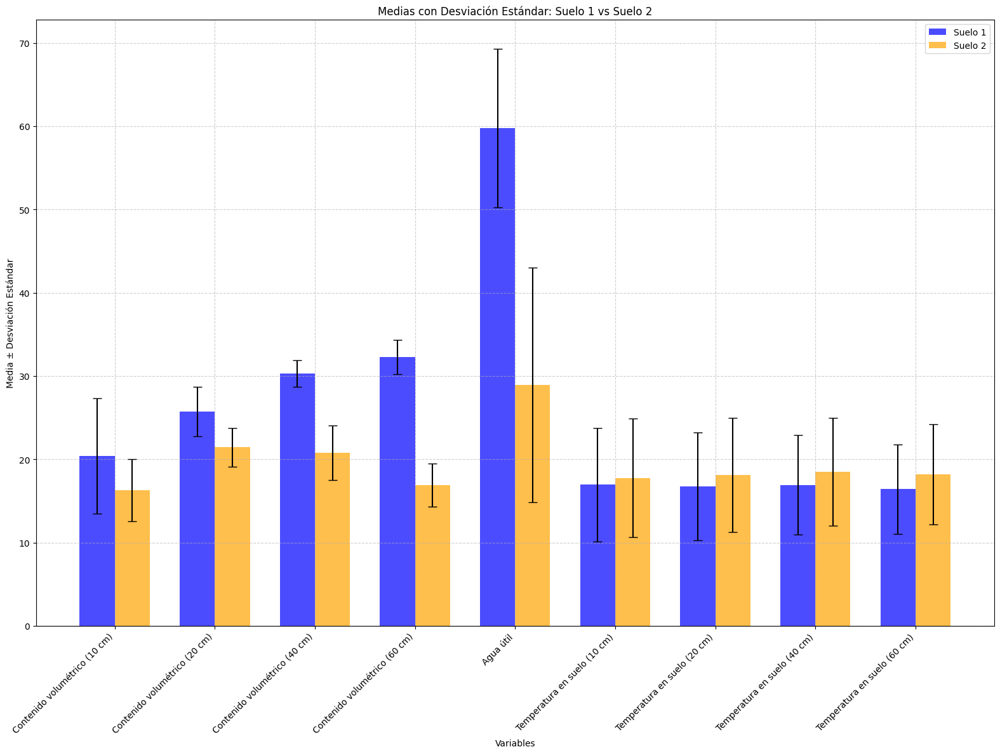

In [7]:
import seaborn as sns

# Seleccionar solo columnas numéricas (excluyendo datetime)
numeric_cols = soil_mini1_data.select_dtypes(include=['number']).columns

# Calcular medias y varianzas para ambos datasets
medias1 = soil_mini1_data[numeric_cols].mean(axis=0)
varianzas1 = soil_mini1_data[numeric_cols].var(axis=0)

medias2 = soil_mini2_data[numeric_cols].mean(axis=0)
varianzas2 = soil_mini2_data[numeric_cols].var(axis=0)

#lo mostramos en forma de grafico para su mejor visualización

plt.figure(figsize=(16, 12))

# Posiciones de las barras
x = np.arange(len(numeric_cols))
width = 0.35

# Calcular desviaciones estándar
std1 = np.sqrt(varianzas1)
std2 = np.sqrt(varianzas2)

plt.bar(x - width/2, medias1, width, yerr=std1, label='Suelo 1', color='blue', alpha=0.7, capsize=5)
plt.bar(x + width/2, medias2, width, yerr=std2, label='Suelo 2', color='orange', alpha=0.7, capsize=5)

plt.xlabel('Variables')
plt.ylabel('Media ± Desviación Estándar')
plt.title('Medias con Desviación Estándar: Suelo 1 vs Suelo 2')
plt.xticks(x, numeric_cols, rotation=45, ha='right')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()



<br>

---
<a id='1-4'></a>
### Agregación diaria de datos de suelo y clima
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


En esta celda se combinan los datos de los sensores de suelo **mini1** y **mini2** calculando la **media por fecha**, obteniendo un único DataFrame de suelo representativo.  
Posteriormente, este DataFrame de suelo se **fusiona con el DataFrame climático** usando las fechas comunes.

A continuación, los datos —originalmente con una granularidad de **15 minutos**— se agrupan a **escala diaria**:
- Las **variables acumulativas** (radiación solar y precipitaciones) se **suman por día**.
- El resto de variables se **promedian por día**.

Además, se crea la columna **humedad relativa mínima diaria**, derivada de la humedad relativa, necesaria para el **cálculo posterior de la evapotranspiración del cultivo**.


<br>


In [8]:
for df in [climate_data, soil_mini1_data, soil_mini2_data]:
    if "Fecha" in df.columns:
        df.set_index("Fecha", inplace=True)
        df.index = pd.to_datetime(df.index)

# --- COMBINAR SUELO ---
soil_combined = pd.concat([soil_mini1_data, soil_mini2_data]).groupby("Fecha").mean()

# --- UNIFICAR SUELO + CLIMA ---
combined_df = pd.concat([soil_combined, climate_data], axis=1, join="inner")

# --- DEFINIR QUÉ COLUMNAS SON ACUMULATIVAS ---
cols_acumulativas = [
    "Radiación solar",
    "Precipitaciones"
]

# --- AGRUPAR SOLO DÍAS EXISTENTES ---
daily_sum = combined_df[cols_acumulativas].groupby(pd.Grouper(freq="D")).sum()
daily_mean = combined_df.drop(columns=cols_acumulativas).groupby(pd.Grouper(freq="D")).mean()

# --- AÑADIR HUMEDAD RELATIVA MÍNIMA ---
# Asumiendo que la columna se llama "Humedad relativa"
daily_min_humedad = combined_df[["Humedad relativa"]].groupby(pd.Grouper(freq="D")).min()
daily_min_humedad = daily_min_humedad.rename(columns={"Humedad relativa": "Humedad relativa mínima"})


# --- COMBINAR RESULTADOS ---
daily_df = pd.concat([daily_mean, daily_sum, daily_min_humedad], axis=1).sort_index()

daily_df = daily_df.interpolate()


# --- RESULTADO FINAL ---
# pd.set_option('display.max_columns', None, 'display.max_rows', None)
display(daily_df)


daily_df.shape



,Contenido volumétrico (10 cm),Contenido volumétrico (20 cm),Contenido volumétrico (40 cm),Contenido volumétrico (60 cm),Agua útil,Temperatura en suelo (10 cm),Temperatura en suelo (20 cm),Temperatura en suelo (40 cm),Temperatura en suelo (60 cm),Índice de calor,...,Punto de rocío,Temperatura del bulbo húmedo,Velocidad del viento,Racha de viento máxima,Dirección del viento,Humectación en hoja (porcentaje),Presión atmosférica,Radiación solar,Precipitaciones,Humedad relativa mínima
Fecha,,,,,,,,,,,,,,,,,,,,,
2023-01-01,17.048438,27.232812,26.251563,27.794271,56.814366,11.004167,10.955208,11.408333,11.480208,12.891667,...,4.675417,9.020438,13.854167,20.531250,176.484375,2.177083,937.696875,5826.0,3.0,42.0
2023-01-02,17.048958,27.236458,26.228646,27.770833,56.926758,10.421875,10.869271,11.564062,11.553646,6.855208,...,4.751562,5.908868,4.093750,7.322917,186.093750,0.500000,942.617708,4620.0,1.0,68.0
2023-01-03,16.934574,27.044149,26.117553,27.701596,56.284717,7.348936,8.566489,10.463830,11.201064,0.775532,...,0.316596,0.594564,0.691489,1.797872,165.638298,0.595745,949.270213,3837.0,0.0,83.0
2023-01-04,16.839063,26.938021,26.095312,27.729688,55.993025,6.418229,7.303646,9.194271,10.352604,0.633333,...,0.521042,0.594022,1.729167,3.333333,174.609375,2.052083,952.208333,3282.0,0.2,97.0
2023-01-05,16.848437,26.856771,25.992708,27.647917,55.659726,6.455729,7.159896,8.735417,9.795312,0.539583,...,0.527917,0.535606,1.333333,2.760417,91.875000,5.562500,948.176042,3054.0,0.0,99.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-10-04,27.030729,26.424479,28.725521,25.901042,61.980537,18.506771,18.428125,18.663542,18.423438,18.060538,...,10.628101,13.796026,1.927083,4.687500,181.406250,0.000000,940.113542,14664.0,0.0,44.0
2025-10-05,25.577083,25.438542,28.291667,25.587500,57.713626,17.705729,18.268750,18.910937,18.635417,13.093750,...,7.322281,10.147863,3.895833,7.802083,78.750000,0.104167,942.435417,15558.0,0.0,47.0
2025-10-06,27.211979,26.796875,28.729167,25.647396,62.337520,16.959375,17.371354,18.278646,18.408333,13.386458,...,6.435258,9.772663,1.625000,4.062500,110.390625,0.114583,942.463542,15573.0,0.0,28.0


(1012, 23)

> Comprobamos que la solución de interpolar para crear datos sinteticos en los dias vacios funciona correctamente


In [9]:
# Ver si hay missing dates
print(f"Rango de fechas: {daily_df.index.min()} to {daily_df.index.max()}")
print(f"Número de registros: {len(daily_df)}")

# Calcular la frecuencia más común
freq_diff = pd.Series(np.diff(daily_df.index)).value_counts()
print("\nFrecuencias encontradas:")
print(freq_diff)

Rango de fechas: 2023-01-01 00:00:00 to 2025-10-08 00:00:00
Número de registros: 1012

Frecuencias encontradas:
1 days    1011
Name: count, dtype: int64


<br>

---
<a id='seccion-2'></a>
# Análisis exploratorio de datos 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


---

<br>

---
<a id='2-1'></a>
### Visualizaciones exploratorias


- Visualizaciones exploratorias: 
    - Diagramas de caja para detectar la distribución y posibles valores atípicos en variables numéricas.
    - Graficos con la evolución de las variables a lo largo del tiempo para visualizar posibles tendencias.


<br>



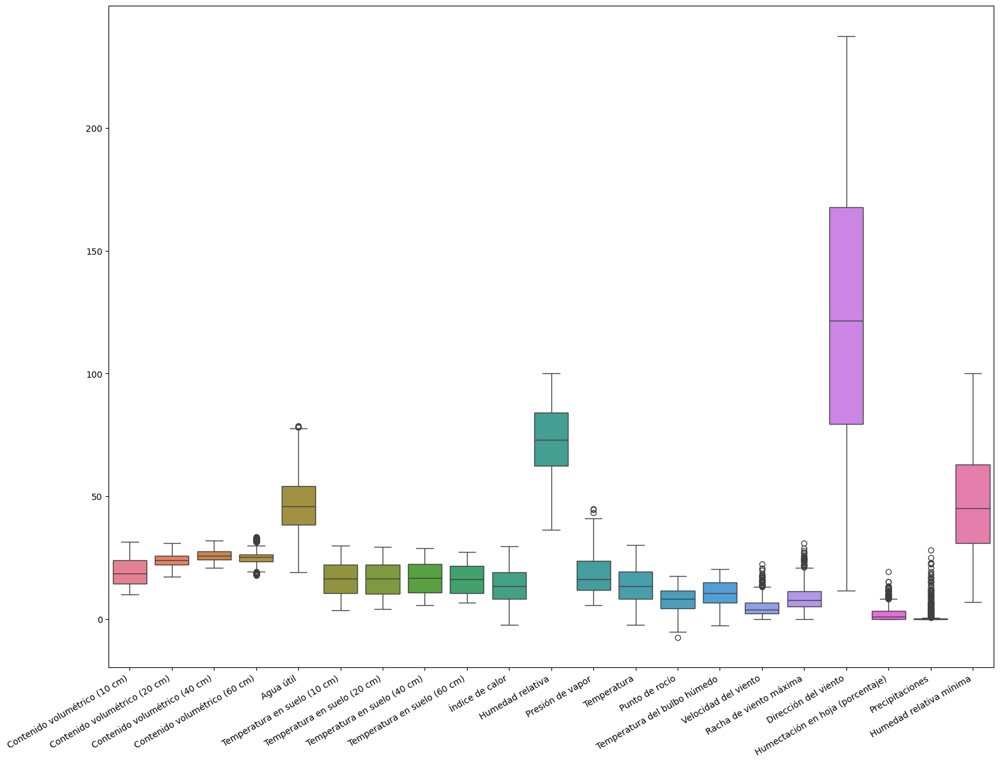

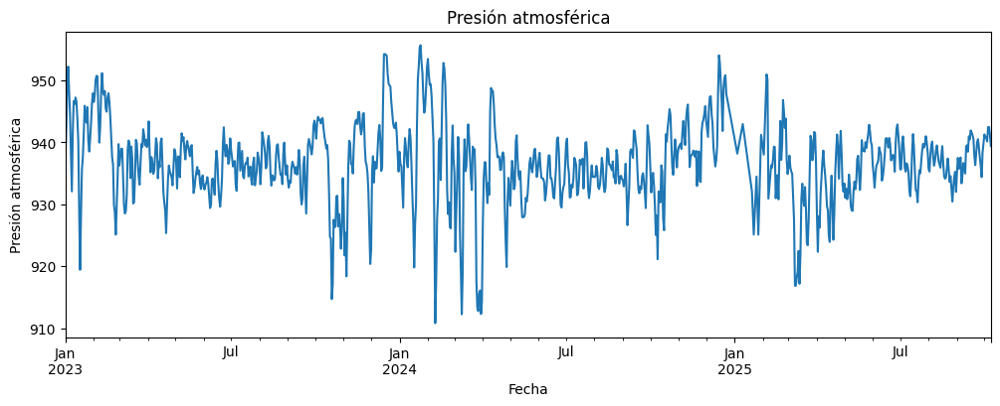

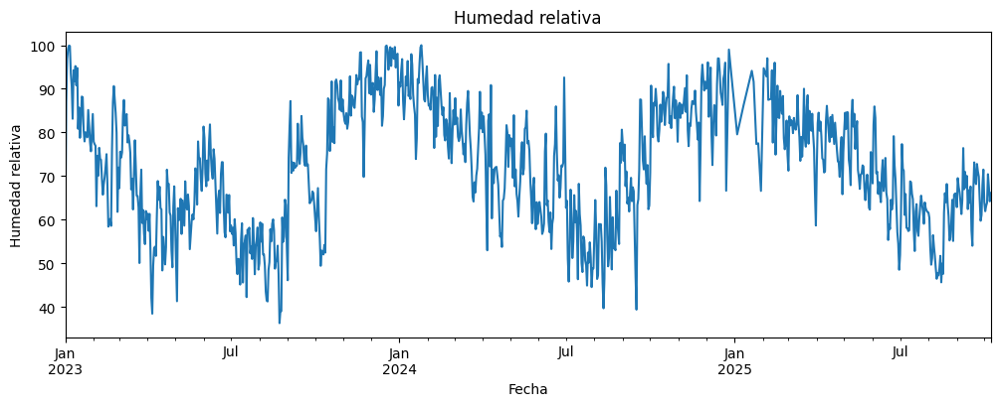

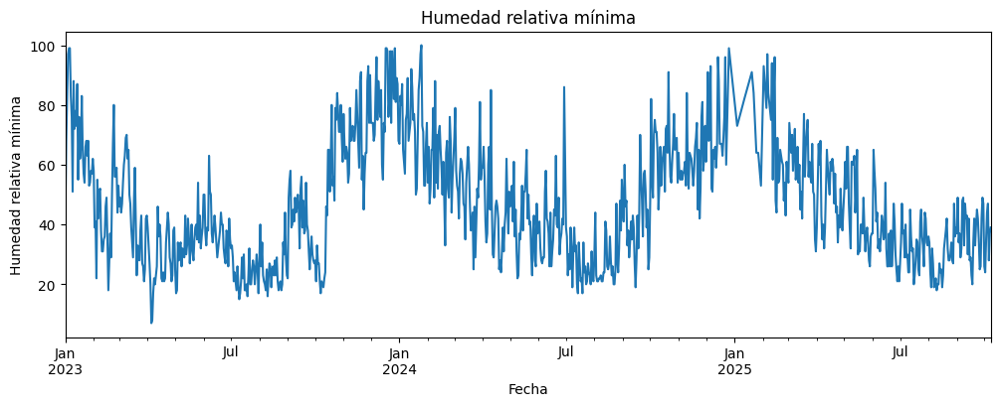

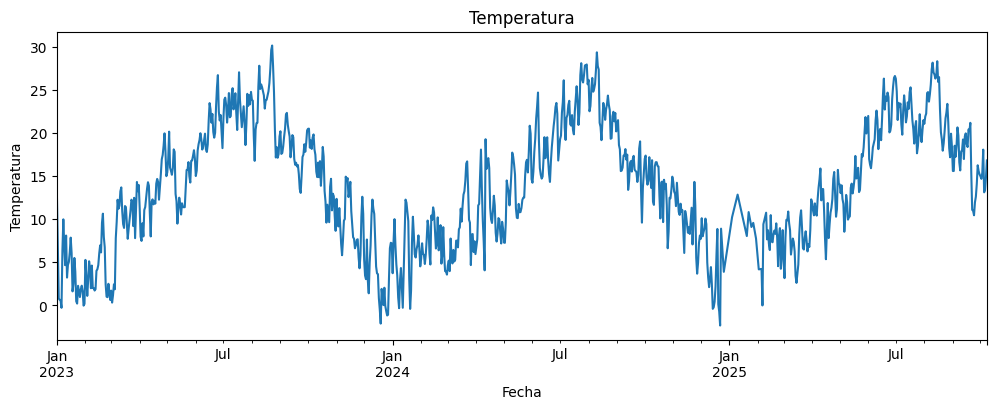

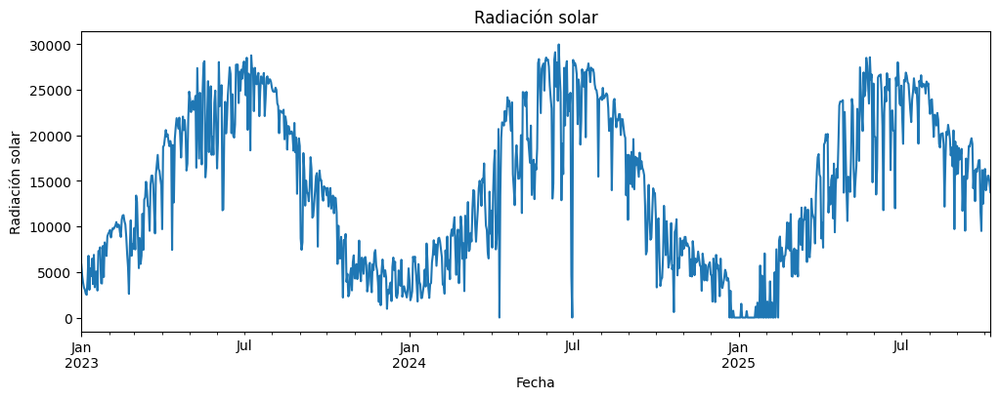

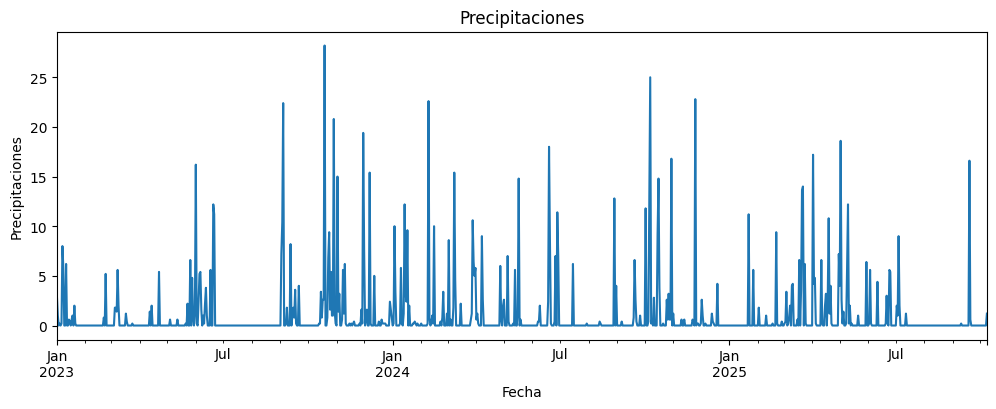

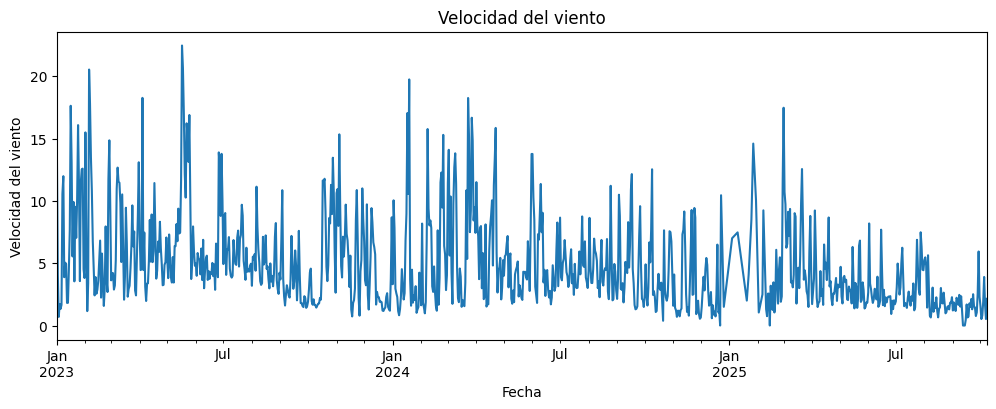

In [10]:
numeric_cols = daily_df.select_dtypes(include=['number']).columns
numeric_cols = numeric_cols.drop(["Radiación solar", "Presión atmosférica"])


# Diagramas de caja para detectar distribucion y valores atípicos en variables numéricas
 
plt.figure(figsize=(18, 18))
boxplot = sns.boxplot(data=daily_df[numeric_cols])
plt.xticks(rotation=30, ha='right', fontsize=10)  # Reduce tamaño de fuente
boxplot.figure.subplots_adjust(bottom=0.3)  # Aumenta espacio inferior
plt.show()


# Variables a monitorizar en el tiempo
vars_clave = ['Presión atmosférica', 'Humedad relativa', 'Humedad relativa mínima',
              'Temperatura', 'Radiación solar', 'Precipitaciones', 'Velocidad del viento']

for var in vars_clave:
    plt.figure(figsize=(12,4))
    daily_df[var].plot(title=var)
    plt.xlabel("Fecha")
    plt.ylabel(var)
    plt.show()

<br>

---
<a id='2-2'></a>
### Selección de features

Mantendremos unicamente en el dataframe, aquellas variables que necesitemos para el calculo de la formula FAO-56. 

- Temperatura
- Humedad relativa
- Humedad relativa mínima
- Velocidad del viento
- Presión atmosférica
- Radiación solar
- Precipitaciones

<br>

In [11]:
columnas_a_eliminar = [
    'Agua útil', 
    'Contenido volumétrico (10 cm)', 
    'Contenido volumétrico (20 cm)', 
    'Contenido volumétrico (40 cm)', 
    'Contenido volumétrico (60 cm)', 
    'Humectación en hoja (porcentaje)', 
    'Presión de vapor', 
    'Punto de rocío', 
    'Racha de viento máxima', 
    'Temperatura del bulbo húmedo', 
    'Temperatura en suelo (10 cm)', 
    'Temperatura en suelo (20 cm)', 
    'Temperatura en suelo (40 cm)', 
    'Temperatura en suelo (60 cm)', 
    'Índice de calor',
    'Dirección del viento'
]

daily_df.drop(columnas_a_eliminar, axis=1, inplace=True)

display(daily_df)

,Humedad relativa,Temperatura,Velocidad del viento,Presión atmosférica,Radiación solar,Precipitaciones,Humedad relativa mínima
Fecha,,,,,,,
2023-01-01,58.583333,12.891667,13.854167,937.696875,5826.0,3.0,42.0
2023-01-02,87.062500,6.855208,4.093750,942.617708,4620.0,1.0,68.0
2023-01-03,96.882979,0.775532,0.691489,949.270213,3837.0,0.0,83.0
2023-01-04,99.197917,0.633333,1.729167,952.208333,3282.0,0.2,97.0
2023-01-05,99.916667,0.539583,1.333333,948.176042,3054.0,0.0,99.0
...,...,...,...,...,...,...,...
2025-10-04,63.895833,18.047917,1.927083,940.113542,14664.0,0.0,44.0
2025-10-05,70.437500,13.093750,3.895833,942.435417,15558.0,0.0,47.0
2025-10-06,67.520833,13.386458,1.625000,942.463542,15573.0,0.0,28.0


<br>

---
<a id='seccion-3'></a>

# Generación datos sintéticos
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


---

<br>


---

<a id='3-1'></a>
### SIMULACIÓN BASADA EN FÍSICA AGRÍCOLA (MODIFICADA PARA PASADO)
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [12]:
from datetime import datetime, timedelta

def calcular_parametros_estacionales(df_real):
    """Calcula parámetros estacionales a partir de datos reales"""
    df = df_real.copy()
    df['dia_año'] = df.index.dayofyear
    
    parametros = {}
    
    for columna in df.columns:
        if columna == 'dia_año':
            continue
            
        # Calcular media y amplitud estacional por día del año
        patron_diario = df.groupby('dia_año')[columna].agg(['mean', 'std']).ffill()
        
        # Suavizar con media móvil
        patron_diario['mean_smooth'] = patron_diario['mean'].rolling(7, center=True, min_periods=1).mean()
        patron_diario['std_smooth'] = patron_diario['std'].rolling(7, center=True, min_periods=1).mean()
        
        parametros[columna] = {
            'media': patron_diario['mean_smooth'].mean(),
            'amplitud': (patron_diario['mean_smooth'].max() - patron_diario['mean_smooth'].min()) / 2,
            'std_promedio': patron_diario['std_smooth'].mean(),
            'patron_diario': patron_diario['mean_smooth']
        }
    
    return parametros

def simular_datos_fisicos_completo(fecha, parametros_estacionales):
    """
    Simula datos basados en relaciones físicas conocidas para todas las variables
    """
    if isinstance(fecha, (pd.Timestamp, datetime)):
        dia_del_ano = fecha.timetuple().tm_yday
    else:
        dia_del_ano = fecha.dayofyear
    
    # Patrón estacional base
    estacionalidad_base = np.sin(2 * np.pi * (dia_del_ano - 80) / 365)
    estacionalidad_secundaria = np.sin(4 * np.pi * (dia_del_ano - 80) / 365)
    
    # TEMPERATURA (patrón principal)
    temp_media = parametros_estacionales['Temperatura']['patron_diario'].get(dia_del_ano, parametros_estacionales['Temperatura']['media'])
    temp_sintetica = temp_media + np.random.normal(0, parametros_estacionales['Temperatura']['std_promedio'] * 0.5)
    
    # HUMEDAD RELATIVA (inversamente relacionada con temperatura)
    hr_media = parametros_estacionales['Humedad relativa']['patron_diario'].get(dia_del_ano, parametros_estacionales['Humedad relativa']['media'])
    hr_sintetica = hr_media - 0.5 * (temp_sintetica - temp_media) + np.random.normal(0, parametros_estacionales['Humedad relativa']['std_promedio'] * 0.5)
    
    # RADIACIÓN SOLAR (correlacionada con temperatura, opuesta a humedad)
    rad_media = parametros_estacionales['Radiación solar']['patron_diario'].get(dia_del_ano, parametros_estacionales['Radiación solar']['media'])
    rad_sintetica = rad_media + 20 * (temp_sintetica - temp_media) + np.random.normal(0, parametros_estacionales['Radiación solar']['std_promedio'] * 0.5)
    
    # VELOCIDAD DEL VIENTO (patrón independiente)
    viento_media = parametros_estacionales['Velocidad del viento']['patron_diario'].get(dia_del_ano, parametros_estacionales['Velocidad del viento']['media'])
    viento_sintetico = viento_media + np.random.normal(0, parametros_estacionales['Velocidad del viento']['std_promedio'] * 0.5)
    
    # PRESIÓN ATMOSFÉRICA (inversamente relacionada con temperatura)
    presion_media = parametros_estacionales['Presión atmosférica']['patron_diario'].get(dia_del_ano, parametros_estacionales['Presión atmosférica']['media'])
    presion_sintetica = presion_media - 0.1 * (temp_sintetica - temp_media) + np.random.normal(0, parametros_estacionales['Presión atmosférica']['std_promedio'] * 0.3)
    
    # PRECIPITACIONES (eventos raros con patrón estacional)
    precip_media = parametros_estacionales['Precipitaciones']['patron_diario'].get(dia_del_ano, parametros_estacionales['Precipitaciones']['media'])
    prob_lluvia = min(0.3, max(0.01, hr_sintetica / 500))
    if np.random.random() < prob_lluvia:
        precipitacion_sintetica = np.random.exponential(precip_media + 0.1) if precip_media > 0 else np.random.exponential(0.5)
    else:
        precipitacion_sintetica = 0.0
    
    # HUMEDAD RELATIVA MÍNIMA (relacionada con humedad relativa)
    hr_min_media = parametros_estacionales['Humedad relativa mínima']['patron_diario'].get(dia_del_ano, parametros_estacionales['Humedad relativa mínima']['media'])
    hr_min_sintetica = hr_min_media + 0.7 * (hr_sintetica - hr_media) + np.random.normal(0, parametros_estacionales['Humedad relativa mínima']['std_promedio'] * 0.5)
    
    # Aplicar restricciones físicas
    return {
        'Humedad relativa': np.clip(hr_sintetica, 10, 100),
        'Temperatura': np.clip(temp_sintetica, -15, 45),
        'Velocidad del viento': max(viento_sintetico, 0),
        'Presión atmosférica': np.clip(presion_sintetica, 900, 1050),
        'Radiación solar': max(rad_sintetica, 0),
        'Precipitaciones': max(precipitacion_sintetica, 0),
        'Humedad relativa mínima': np.clip(hr_min_sintetica, 5, 100)
    }

def generar_datos_fisicos_pasado(df_real, años_generar=5):
    """Genera datos sintéticos en el PASADO usando simulación física"""
    
    # Calcular fecha de inicio (años_generar antes del primer dato real)
    fecha_inicio_real = df_real.index.min()
    fecha_inicio_sintetico = fecha_inicio_real - timedelta(days=365 * años_generar)
    
    parametros = calcular_parametros_estacionales(df_real)
    
    datos_sinteticos = []
    fechas = []
    
    fecha_actual = fecha_inicio_sintetico
    for _ in range(años_generar * 365):
        datos_dia = simular_datos_fisicos_completo(fecha_actual, parametros)
        datos_sinteticos.append(datos_dia)
        fechas.append(fecha_actual)
        fecha_actual += timedelta(days=1)
    
    df_sintetico = pd.DataFrame(datos_sinteticos, index=fechas)
    df_sintetico.index.name = 'Fecha'
    
    return df_sintetico


<br>

---

<a id='3-2'></a>
### BOOTSTRAPPING ESTACIONAL CON PERTURBACIÓN (MODIFICADO PARA PASADO)
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [13]:
def aplicar_restricciones_fisicas(datos_mes_sintetico):
    """Aplica restricciones físicas a los datos sintéticos"""
    # Humedad relativa entre 10% y 100%
    datos_mes_sintetico[:, 0] = np.clip(datos_mes_sintetico[:, 0], 10, 100)
    # Temperatura entre -15°C y 45°C
    datos_mes_sintetico[:, 1] = np.clip(datos_mes_sintetico[:, 1], -15, 45)
    # Velocidad del viento no negativa
    datos_mes_sintetico[:, 2] = np.maximum(datos_mes_sintetico[:, 2], 0)
    # Presión atmosférica entre 900 y 1050 hPa
    datos_mes_sintetico[:, 3] = np.clip(datos_mes_sintetico[:, 3], 900, 1050)
    # Radiación solar no negativa
    datos_mes_sintetico[:, 4] = np.maximum(datos_mes_sintetico[:, 4], 0)
    # Precipitaciones no negativas
    datos_mes_sintetico[:, 5] = np.maximum(datos_mes_sintetico[:, 5], 0)
    # Humedad relativa mínima entre 5% y 100%
    datos_mes_sintetico[:, 6] = np.clip(datos_mes_sintetico[:, 6], 5, 100)
    
    return datos_mes_sintetico

def bootstrap_estacional_perturbado_pasado(df_existente, años_extra=5):
    """Crea datos sintéticos en el PASADO perturbando años existentes"""
    datos_sinteticos = []
    columnas = df_existente.columns
    
    # Determinar el primer año disponible y calcular años anteriores
    primer_año_real = df_existente.index.min().year
    primer_año_sintetico = primer_año_real - años_extra
    
    for año_sintetico in range(primer_año_sintetico, primer_año_real):
        for mes in range(1, 13):
            # Tomar datos del mes correspondiente de años existentes
            datos_mes_original = df_existente[df_existente.index.month == mes]
            
            if len(datos_mes_original) > 0:
                # Seleccionar aleatoriamente días del mes de años existentes
                n_dias = len(datos_mes_original)
                # Usar el número correcto de días para cada mes
                if mes in [1, 3, 5, 7, 8, 10, 12]:
                    dias_en_mes = 31
                elif mes in [4, 6, 9, 11]:
                    dias_en_mes = 30
                else:  # Febrero
                    # Simplificación: usar 28 días para febrero
                    dias_en_mes = 28
                
                indices_aleatorios = np.random.choice(n_dias, size=dias_en_mes, replace=True)
                datos_mes_seleccionados = datos_mes_original.iloc[indices_aleatorios].values
                
                # Perturbación controlada manteniendo correlaciones
                perturbacion = np.random.normal(1, 0.15, datos_mes_seleccionados.shape)
                datos_mes_sintetico = datos_mes_seleccionados * perturbacion
                
                # Aplicar restricciones de dominio
                datos_mes_sintetico = aplicar_restricciones_fisicas(datos_mes_sintetico)
                
                # Crear fechas sintéticas para el mes en el pasado
                for dia in range(len(datos_mes_sintetico)):
                    try:
                        fecha_sintetica = pd.Timestamp(year=año_sintetico, month=mes, day=dia+1)
                        datos_sinteticos.append([fecha_sintetica] + list(datos_mes_sintetico[dia]))
                    except ValueError:
                        # Para días inválidos (como 30 de febrero)
                        continue
    
    df_sintetico = pd.DataFrame(datos_sinteticos, columns=['Fecha'] + list(columnas))
    df_sintetico.set_index('Fecha', inplace=True)
    df_sintetico = df_sintetico.sort_index()
    return df_sintetico


<br>

---

<a id='3-3'></a>
### Creación gráficos comparadores datos sinteticos vs datos reales
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [14]:
def comparar_datos_reales_vs_sinteticos(df_real, df_sintetico, atributos=None, 
                                       años_comparacion=4, fecha_inicio_comparacion=None):
    """
    Compara visualmente datos reales vs sintéticos para cada atributo
    """
    if atributos is None:
        atributos = [col for col in df_real.columns if col not in ['fecha', 'Fecha', 'date', 'Date', 'origen']]
    
    # Asegurar que ambos dataframes tienen índice datetime
    if not isinstance(df_real.index, pd.DatetimeIndex):
        df_real = df_real.copy()
        df_real.index = pd.to_datetime(df_real.index)
    
    if not isinstance(df_sintetico.index, pd.DatetimeIndex):
        df_sintetico = df_sintetico.copy()
        df_sintetico.index = pd.to_datetime(df_sintetico.index)
    
    # Determinar fecha de inicio para comparación
    if fecha_inicio_comparacion is None:
        # Usar la fecha más temprana entre reales y sintéticos
        fecha_inicio = min(df_real.index.min(), df_sintetico.index.min())
    else:
        fecha_inicio = pd.to_datetime(fecha_inicio_comparacion)
    
    # Calcular fecha fin basada en años_comparacion
    fecha_fin = fecha_inicio + timedelta(days=365 * años_comparacion + len(df_real))
    
    # Asegurar que la fecha fin no excede los datos disponibles
    fecha_fin = min(fecha_fin, max(df_real.index.max(), df_sintetico.index.max()))
    
    # Filtrar datos para el período de comparación
    mask_real = (df_real.index >= fecha_inicio) & (df_real.index <= fecha_fin)
    mask_sintetico = (df_sintetico.index >= fecha_inicio) & (df_sintetico.index <= fecha_fin)
    
    df_real_comp = df_real[mask_real].copy()
    df_sintetico_comp = df_sintetico[mask_sintetico].copy()
    
    # Añadir columnas auxiliares
    for df in [df_real_comp, df_sintetico_comp]:
        df['tipo'] = 'Real' if df is df_real_comp else 'Sintético'
        df['año'] = df.index.year
        df['dia_año'] = df.index.dayofyear
    

    # Crear gráficos para cada atributo
    figuras = []
    for i, atributo in enumerate(atributos):
        fig = crear_grafico_comparacion(atributo, df_real_comp, df_sintetico_comp, 
                                      fecha_inicio, fecha_fin, i + 1)
        figuras.append(fig)

    return figuras

def crear_grafico_comparacion(atributo, df_real, df_sintetico, fecha_inicio, fecha_fin, num_grafico):
    """Crea un gráfico de comparación para un atributo específico"""
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))
    
    # Gráfico 1: Serie temporal completa
    ax1.plot(df_real.index, df_real[atributo], 
             color='blue', alpha=0.7, linewidth=1, label='Datos Reales')
    ax1.plot(df_sintetico.index, df_sintetico[atributo], 
             color='red', alpha=0.7, linewidth=1, label='Datos Sintéticos')
    
    ax1.set_title(f'Comparación Temporal: {atributo}\nPeríodo: {fecha_inicio.date()} - {fecha_fin.date()}', 
                  fontsize=14, fontweight='bold')
    ax1.set_ylabel(atributo, fontsize=12)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # Gráfico 2: Comparación por año (superpuesto)
    años_unicos = sorted(set(df_real['año'].unique()) | set(df_sintetico['año'].unique()))
    
    # Paleta de colores para años
    colores_reales = plt.cm.Blues(np.linspace(0.4, 0.8, len(años_unicos)))
    colores_sinteticos = plt.cm.Reds(np.linspace(0.4, 0.8, len(años_unicos)))
    
    for i, año in enumerate(años_unicos):
        # Datos reales
        datos_año_real = df_real[df_real['año'] == año]
        if not datos_año_real.empty:
            ax2.plot(datos_año_real['dia_año'], datos_año_real[atributo],
                    color=colores_reales[i], alpha=0.7, linewidth=1.5,
                    label=f'Real {año}' if i < 3 else "")
        
        # Datos sintéticos
        datos_año_sint = df_sintetico[df_sintetico['año'] == año]
        if not datos_año_sint.empty:
            ax2.plot(datos_año_sint['dia_año'], datos_año_sint[atributo],
                    color=colores_sinteticos[i], alpha=0.7, linewidth=1.5, linestyle='--',
                    label=f'Sintético {año}' if i < 3 else "")
    
    ax2.set_title(f'Comparación Estacional por Año: {atributo}', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Día del Año', fontsize=12)
    ax2.set_ylabel(atributo, fontsize=12)
    ax2.legend(fontsize=9)
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Añadir estadísticas comparativas
    stats_text = f"""
    Estadísticas Comparativas ({fecha_inicio.year}-{fecha_fin.year}):
    Real - Media: {df_real[atributo].mean():.2f}, Std: {df_real[atributo].std():.2f}
    Sintético - Media: {df_sintetico[atributo].mean():.2f}, Std: {df_sintetico[atributo].std():.2f}
    Diferencia Media: {abs(df_real[atributo].mean() - df_sintetico[atributo].mean()):.2f}
    """
    
    fig.text(0.02, 0.02, stats_text, fontsize=9, 
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.7))
    
    return fig


<br>

---

<a id='3-4'></a>
### Ejecución técnicas de generación de datos sintéticos
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [15]:
def ejecutar_comparacion_pasado_completa(df_real, años_generar=4, fecha_inicio_comparacion=None):
    """
    Ejecuta la generación sintética en el PASADO y la comparación visual
    """
    print("Iniciando generación de datos sintéticos EN EL PASADO...")
    
    # Método 1: Simulación Física en el pasado
    print("Generando datos en el pasado con simulación física...")
    df_sintetico_fisico_pasado = generar_datos_fisicos_pasado(df_real, años_generar=años_generar)
    
    # Método 2: Bootstrapping Estacional en el pasado
    print("Generando datos en el pasado con bootstrapping estacional...")
    df_sintetico_bootstrap_pasado = bootstrap_estacional_perturbado_pasado(df_real, años_extra=años_generar)
    
    # Combinar datos sintéticos del pasado con datos reales para entrenamiento
    print("Combinando datos sintéticos del pasado con datos reales...")
    df_combinado_fisico = pd.concat([df_sintetico_fisico_pasado, df_real])
    df_combinado_bootstrap = pd.concat([df_sintetico_bootstrap_pasado, df_real])
    
    # Comparar ambos métodos con datos reales
    print("Generando comparaciones visuales...")
    
    # Comparación método físico
    figuras_fisico = comparar_datos_reales_vs_sinteticos(
        df_real=df_real,
        df_sintetico=df_sintetico_fisico_pasado,
        años_comparacion=años_generar,
        fecha_inicio_comparacion=fecha_inicio_comparacion
    )

    
    # Comparación método bootstrapping
    figuras_bootstrap = comparar_datos_reales_vs_sinteticos(
        df_real=df_real,
        df_sintetico=df_sintetico_bootstrap_pasado,
        años_comparacion=años_generar,
        fecha_inicio_comparacion=fecha_inicio_comparacion
    )
    
    
    return {
        'sintetico_fisico_pasado': df_sintetico_fisico_pasado,
        'sintetico_bootstrap_pasado': df_sintetico_bootstrap_pasado,
        'combinado_fisico': df_combinado_fisico,
        'combinado_bootstrap': df_combinado_bootstrap,
        'figuras_fisico': figuras_fisico,
        'figuras_bootstrap': figuras_bootstrap
    }

Iniciando generación de datos sintéticos EN EL PASADO...
Generando datos en el pasado con simulación física...
Generando datos en el pasado con bootstrapping estacional...
Combinando datos sintéticos del pasado con datos reales...
Generando comparaciones visuales...
¡Proceso completado exitosamente!

Rangos de fechas:
Real: 2023-01-01 00:00:00 a 2025-10-08 00:00:00
Sintético físico: 2019-01-02 00:00:00 a 2022-12-31 00:00:00
Sintético bootstrap: 2019-01-01 00:00:00 a 2022-12-31 00:00:00
Combinado físico: 2019-01-02 00:00:00 a 2025-10-08 00:00:00


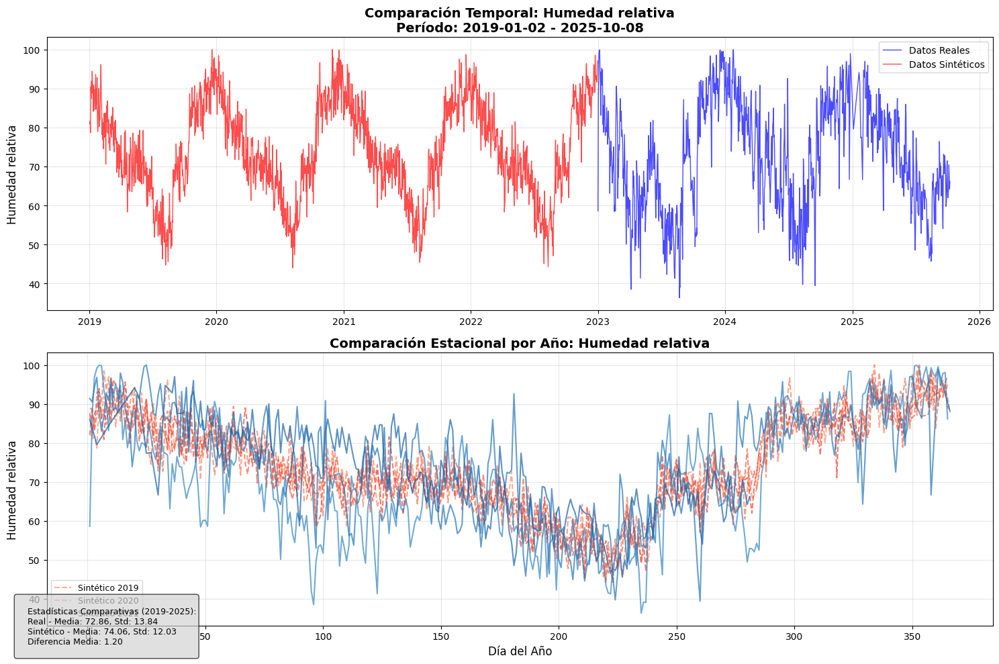

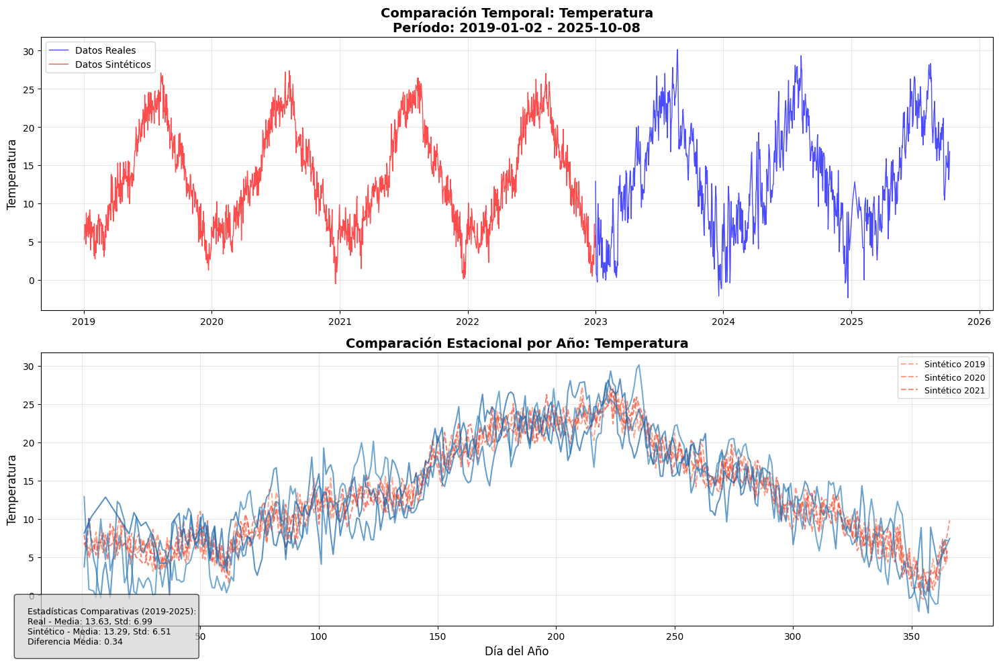

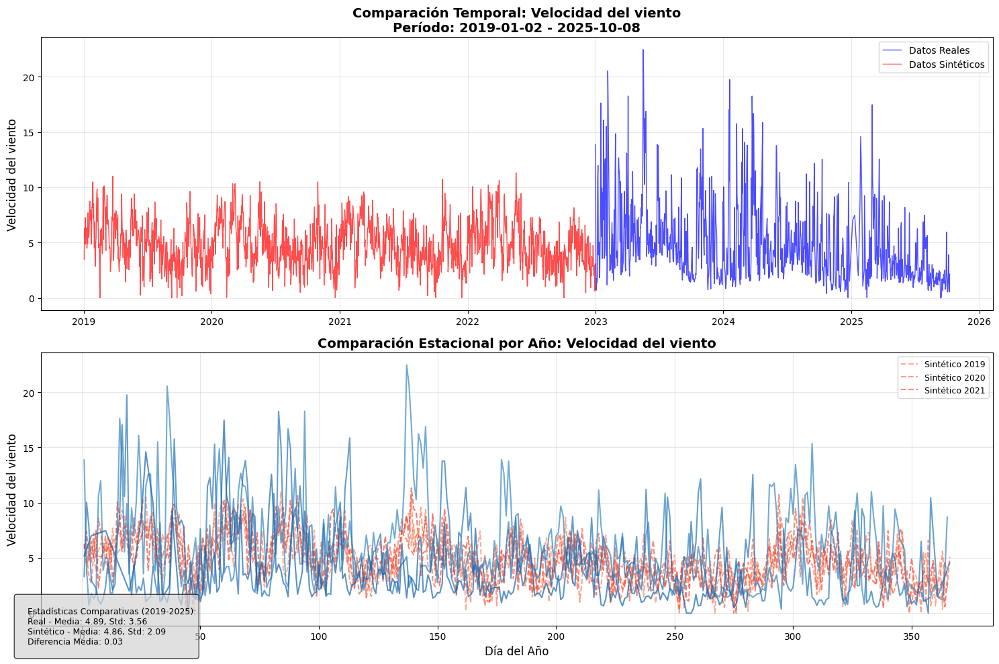

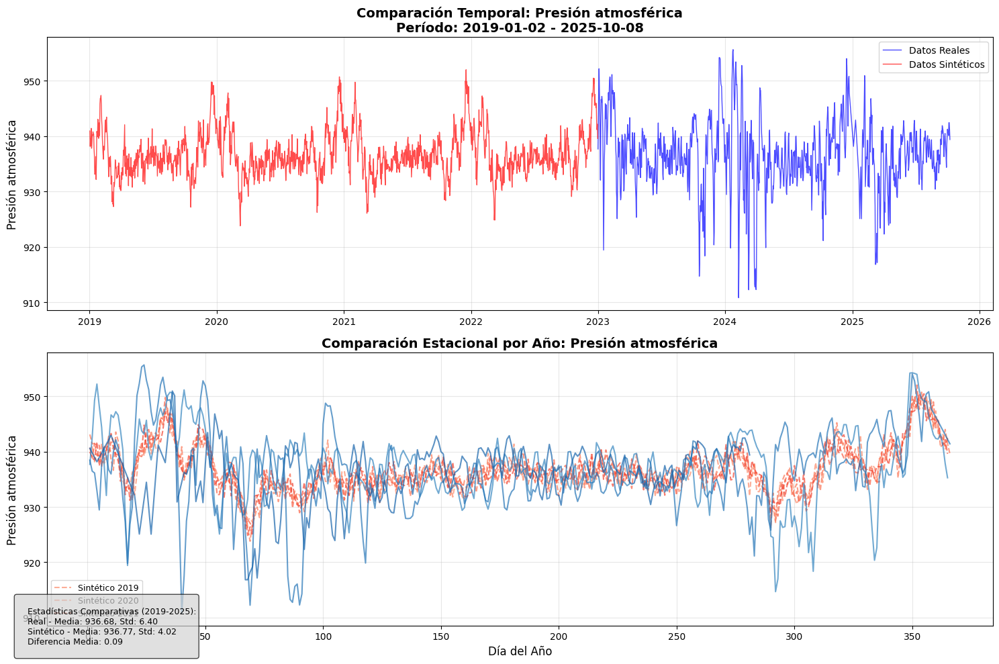

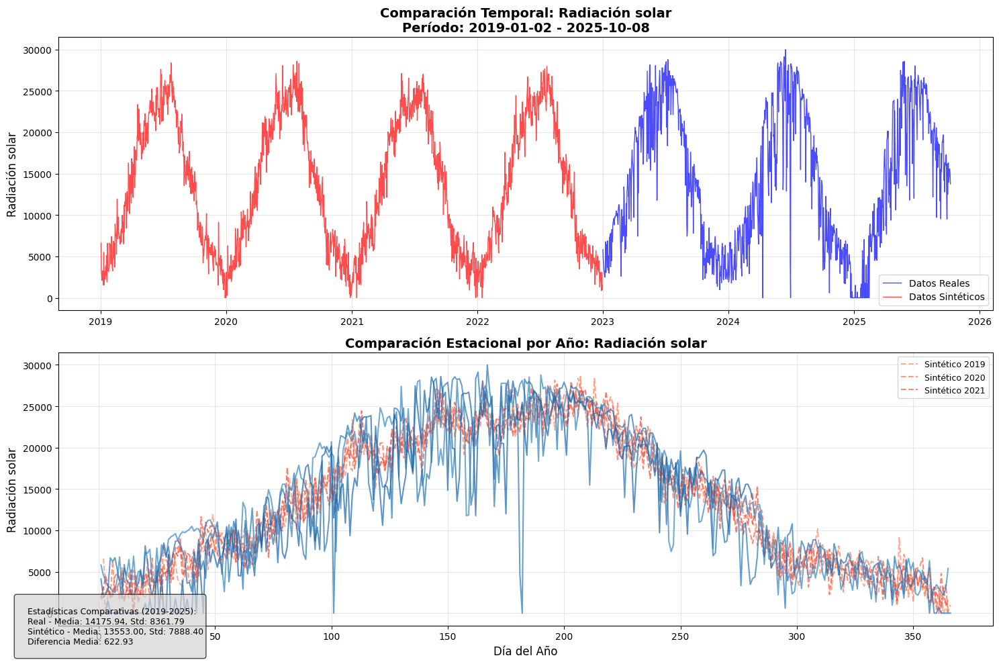

...

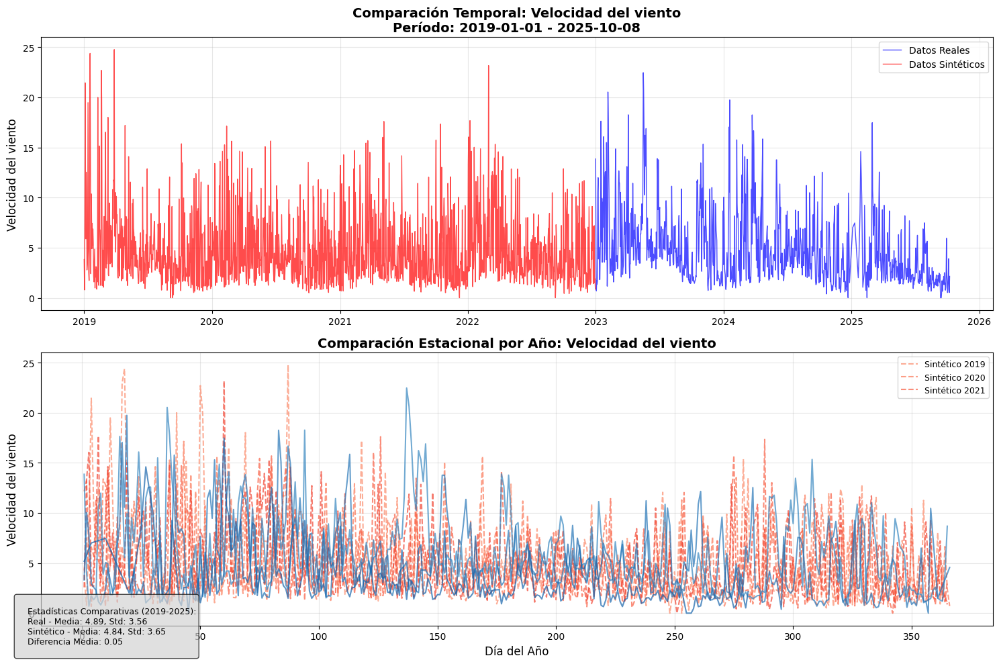

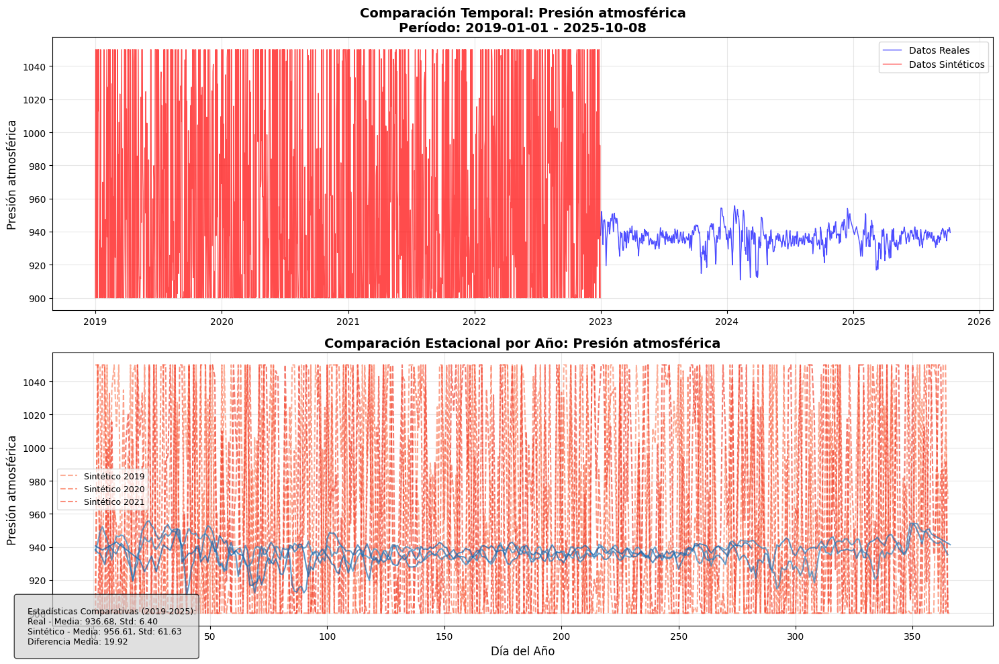

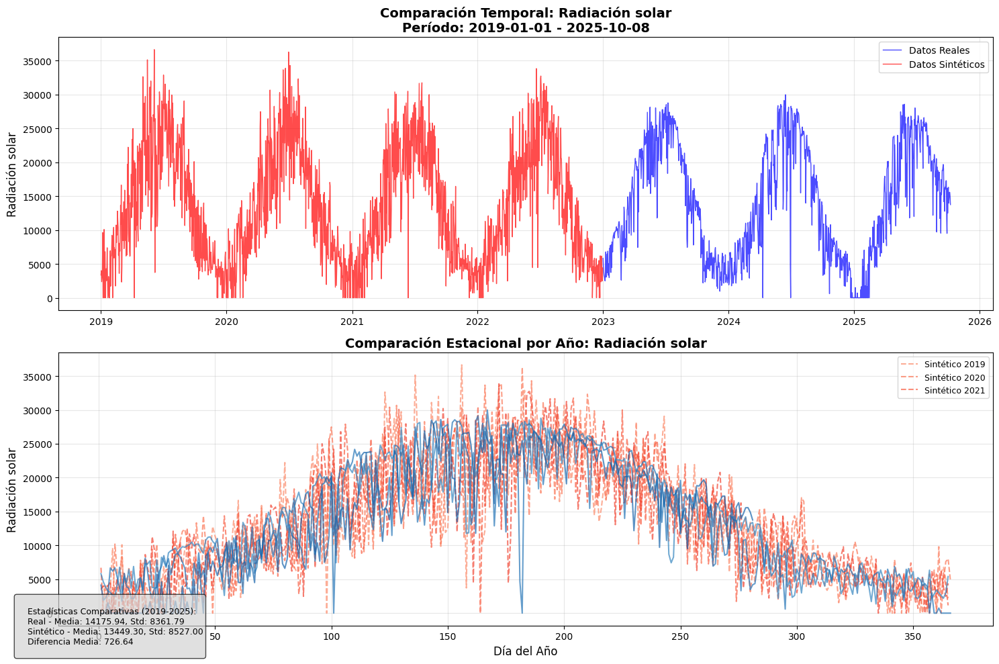

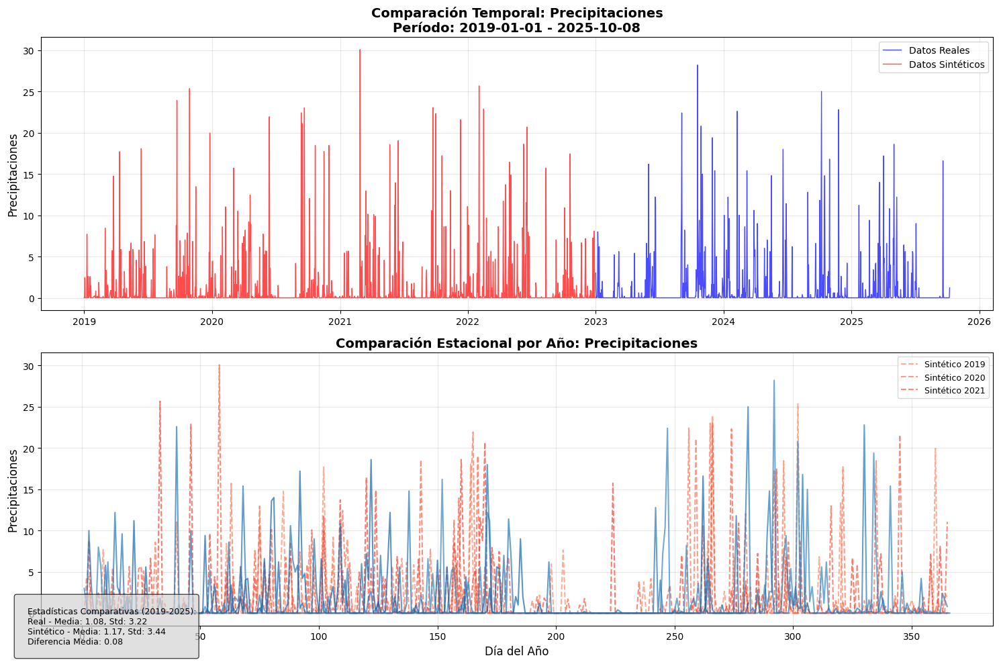

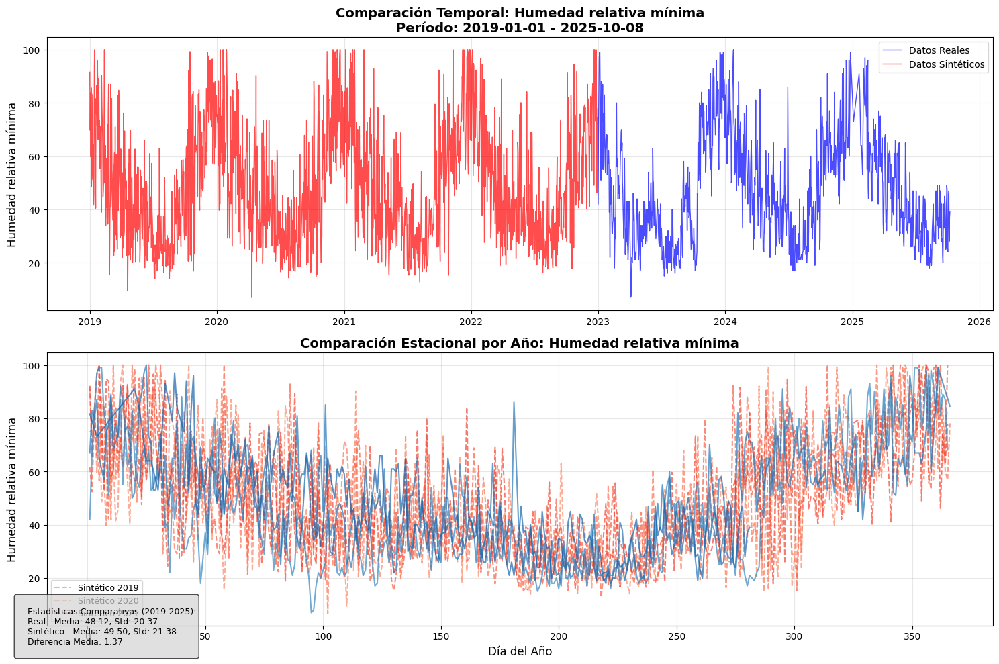

In [16]:
try:
    # Asumiendo que daily_df es tu DataFrame real
    resultados = ejecutar_comparacion_pasado_completa(
        df_real=daily_df,  # Tu DataFrame real
        años_generar=4,    # Generar 4 años de datos sintéticos en el pasado
        fecha_inicio_comparacion=None  # Se calculará automáticamente
    )
    
    print("¡Proceso completado exitosamente!")

    # Mostrar rangos de fechas
    print("\nRangos de fechas:")
    print(f"Real: {daily_df.index.min()} a {daily_df.index.max()}")
    print(f"Sintético físico: {resultados['sintetico_fisico_pasado'].index.min()} a {resultados['sintetico_fisico_pasado'].index.max()}")
    print(f"Sintético bootstrap: {resultados['sintetico_bootstrap_pasado'].index.min()} a {resultados['sintetico_bootstrap_pasado'].index.max()}")
    print(f"Combinado físico: {resultados['combinado_fisico'].index.min()} a {resultados['combinado_fisico'].index.max()}")
    
except Exception as e:
    print(f"Error durante la ejecución: {e}")
    

<br>

---
<a id='3-5'></a>
### Guardar datos de entrenamiento para un futuro uso en los modelos
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [17]:
import os

def crear_directorio_si_no_existe(ruta):
    """Crea un directorio si no existe"""
    if not os.path.exists(ruta):
        os.makedirs(ruta)
        print(f"Directorio creado: {ruta}")

        
# Función adicional para guardar los datos combinados para entrenamiento
def guardar_datos_entrenamiento(resultados, ruta_guardado="./data/datos_entrenamiento"):
    """Guarda los datos combinados para entrenamiento de modelos"""
    crear_directorio_si_no_existe(ruta_guardado)
    
    resultados['combinado_fisico'].to_csv(f"{ruta_guardado}/datos_entrenamiento_fisico.csv")
    resultados['combinado_bootstrap'].to_csv(f"{ruta_guardado}/datos_entrenamiento_bootstrap.csv")
    
    print(f"Datos de entrenamiento guardados en: {ruta_guardado}")


guardar_datos_entrenamiento(resultados)

Datos de entrenamiento guardados en: ./data/datos_entrenamiento


<br>

---
### Importar datos de entrenamiento combinados (sintéticos y reales) a DataFrame
---

In [18]:
synthetic_data_path = base_path / "datos_entrenamiento"
physic_data_path = synthetic_data_path / "datos_entrenamiento_fisico.csv"

daily_combined_df = pd.read_csv(physic_data_path, index_col='Fecha', parse_dates=True)


display(daily_combined_df)

,Humedad relativa,Temperatura,Velocidad del viento,Presión atmosférica,Radiación solar,Precipitaciones,Humedad relativa mínima
Fecha,,,,,,,
2019-01-02,80.968206,5.286936,3.492735,940.956288,6611.525552,0.0,73.991470
2019-01-03,81.666437,5.476028,6.302758,938.157792,3528.141094,0.0,79.395424
2019-01-04,78.686045,7.230553,5.411157,939.646331,2612.183850,0.0,71.876329
2019-01-05,90.455253,6.327118,7.261875,938.273529,2092.541036,0.0,87.638952
2019-01-06,87.356777,7.239543,4.845675,941.433851,2317.185347,0.0,83.844725
...,...,...,...,...,...,...,...
2025-10-04,63.895833,18.047917,1.927083,940.113542,14664.000000,0.0,44.000000
2025-10-05,70.437500,13.093750,3.895833,942.435417,15558.000000,0.0,47.000000
2025-10-06,67.520833,13.386458,1.625000,942.463542,15573.000000,0.0,28.000000


<br>

---
<a id='2-3'></a>

### Normalización de los datos
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

Usamos ColumnsTransformer, que aunque no se haya visto en el contenido de la asignatura, nos permite aplicar diferentes scalers a distintas columnas, adaptandose mejor según el tipo de datos que contiene la columna, por ejemplo:

Usamos StandarScaler cuando:
- Cuando los datos siguen una distribución normal (o cerca de ello).

Usamos RobustScaler cuando:

- Si tus datos tienen outliers fuertes. (Esto se puede observar en el diagrama de caja que hemos obtenido anteriormente, aplicamos RobustScaler a aquellas variables cuyos puntos circulares negros(Valores fuera del minimo o maximo) esten a un 3x IQR)



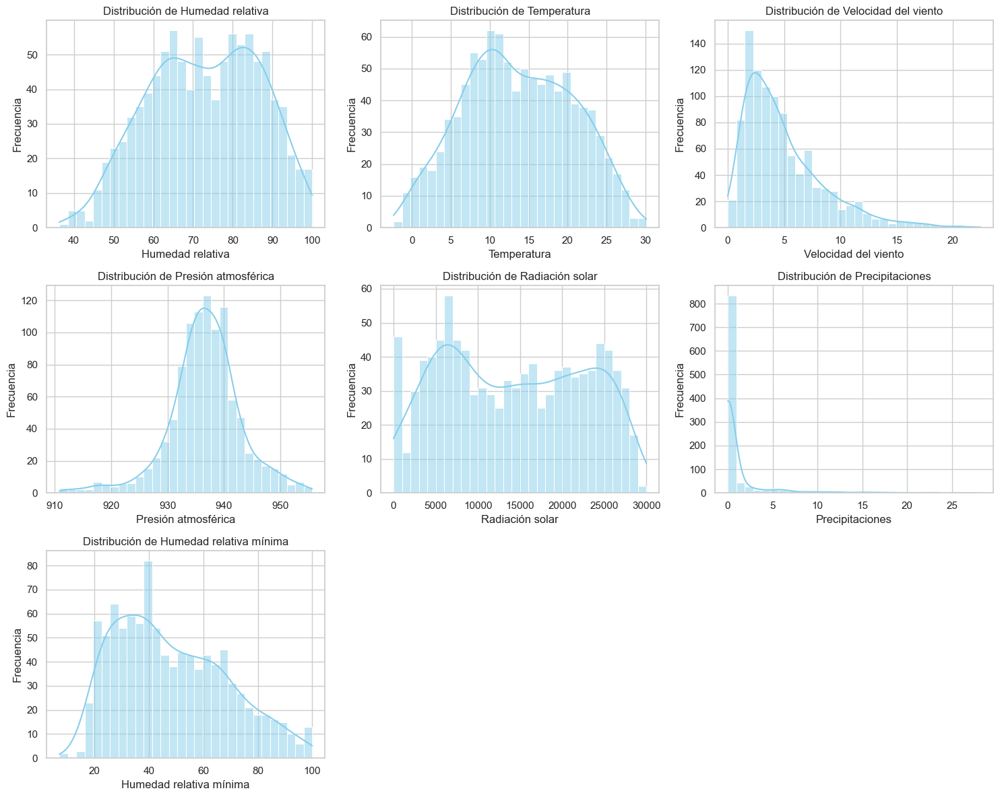

In [19]:
from scipy.stats import normaltest
import math

sns.set(style="whitegrid")

columnas_numericas = daily_df.select_dtypes(include=['number']).columns
n_cols = 3  # Número de gráficas por fila (ajústalo a tu gusto)
n_filas = math.ceil(len(columnas_numericas) / n_cols)   

# Crear figura con subplots
fig, axes = plt.subplots(n_filas, n_cols, figsize=(5*n_cols, 4*n_filas))
axes = axes.flatten()  # Aplanar el arreglo de axes para iterar fácilmente

# Dibujar histogramas
for i, columna in enumerate(columnas_numericas):
    sns.histplot(daily_df[columna], kde=True, bins=30, color='skyblue', ax=axes[i])
    axes[i].set_title(f"Distribución de {columna}")
    axes[i].set_xlabel(columna)
    axes[i].set_ylabel("Frecuencia")

# Si sobran subplots vacíos, los eliminamos
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Ajusta automáticamente para que no se solapen las gráficas
plt.show()

# --- 2. Calcular los valores atípicos (outliers) usando 3xIQR ---
outliers_info = {}

for columna in columnas_numericas:
    Q1 = daily_df[columna].quantile(0.25)
    Q3 = daily_df[columna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 3 * IQR
    limite_superior = Q3 + 3 * IQR

    outliers = daily_df[(daily_df[columna] < limite_inferior) | (daily_df[columna] > limite_superior)][columna]
    outliers_info[columna] = len(outliers)


<br>

---

#### Test de normalidad y recomendación de escalado 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---


In [20]:
recomendaciones = {}

for columna in columnas_numericas:
    estadistico, p_valor = normaltest(daily_df[columna].dropna())
    es_normal = p_valor > 0.05  # Si p > 0.05, no se rechaza la normalidad
    tiene_outliers = outliers_info[columna] > 0

    if tiene_outliers:
        escalador = "RobustScaler"
    elif es_normal:
        escalador = "StandardScaler"
    else:
        escalador = "StandardScaler (aproximado)"

    recomendaciones[columna] = {
        "p_valor_normaltest": p_valor,
        "outliers_(3xIQR)": outliers_info[columna],
        "escalador_recomendado": escalador
    }

# --- 4. Mostrar resumen de recomendaciones ---
recomendaciones_df = pd.DataFrame(recomendaciones).T
print("\n📊 Recomendaciones de escalado:\n")
print(recomendaciones_df)


📊 Recomendaciones de escalado:

                        p_valor_normaltest outliers_(3xIQR)  \
Humedad relativa                       0.0                0   
Temperatura                            0.0                0   
Velocidad del viento                   0.0                4   
Presión atmosférica                    0.0                5   
Radiación solar                        0.0                0   
Precipitaciones                        0.0              178   
Humedad relativa mínima                0.0                0   

                               escalador_recomendado  
Humedad relativa         StandardScaler (aproximado)  
Temperatura              StandardScaler (aproximado)  
Velocidad del viento                    RobustScaler  
Presión atmosférica                     RobustScaler  
Radiación solar          StandardScaler (aproximado)  
Precipitaciones                         RobustScaler  
Humedad relativa mínima  StandardScaler (aproximado)  


<br>

---
<a id='seccion-4'></a>
# Desarrollo de Modelos 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

<br>


| Fase | Objetivo | Modelos sugeridos |
|------|-----------|-------------------|
| **Fase 1** | Exploración y análisis de estacionalidad | SARIMA / SARIMAX |
| **Fase 2** | Modelado multivariable lineal | VAR |
| **Fase 3** | Primeros experimentos con LSTM / GRU | LSTM, GRU |
| **Fase 4** | Predicción multi-step | LSTM / TCN con ventanas móviles |
| **Fase 5** | Predicción end-to-end a largo plazo | Informer, Autoformer, PatchTST |
| **Fase 6** | Implementación avanzada en entorno agrícola | **SageFormer** |

- Evaluación de modelos:
    - Utilizar métricas como accuracy, precisión, recall, F1-score y AUC-ROC,
    teniendo en cuenta el desequilibrio de clases.
    - Aplicar validación cruzada para evaluar la capacidad de generalización de los
    modelos.

<br>

---

<a id='4-1'></a>
## Importación de librerias necesarias 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


---

In [21]:
import joblib
#warnings.filterwarnings('ignore')

# Scikit-learn para pipelines
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin

# Modelos de series temporales
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# LSTM
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Utilidades
from typing import Dict, List, Tuple


print("Librerías importadas correctamente")

2026-02-13 08:27:33.881388: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Librerías importadas correctamente


<br>

---

<a id='4-2'></a>
##  Parámetros de configuración del proceso de entrenamiento

**Parámetros de los modelos**
- `SARIMA_ORDER (p, d, q)`: define la estructura autorregresiva, de diferenciación y de media móvil del modelo SARIMA.
- `SARIMA_SEASONAL_ORDER (P, D, Q, s)`: especifica la componente estacional del modelo SARIMA, donde `s = 30` representa una estacionalidad mensual (30 días).
- `VAR_MAXLAGS`: número máximo de retardos utilizados en el modelo VAR para capturar dependencias temporales entre variables.

**Parámetros de predicción**
- `PREDICTION_HORIZON`: horizonte temporal de predicción en días (240 días ≈ 8 meses).
- `TEST_SIZE`: número de días reservados para el conjunto de test (180 días ≈ 6 meses).

**Rutas de almacenamiento**
- `MODEL_PATH`: directorio donde se guardan los modelos entrenados.
- `RESULTS_PATH`: directorio donde se almacenan los resultados y métricas de los experimentos.

**Gestión de directorios**
- `setup_directories()`: crea automáticamente las carpetas necesarias para modelos y resultados si no existen.

**Datos de entrenamiento**
- `SYNTHETIC_DATA_PATH`: ruta al directorio que contiene los datos de entrenamiento.
- `PHYSIC_DATA_PATH`: archivo CSV con los datos de entrenamiento basados en modelos físicos.

In [22]:
class Config:
    """Clase de configuración para el proyecto"""
    
    # Parámetros de modelos
    SARIMA_ORDER = (1, 1, 1)
    SARIMA_SEASONAL_ORDER = (1, 1, 1, 30)
    VAR_MAXLAGS = 15
    
    # Parámetros de predicción
    PREDICTION_HORIZON = 240  # 8 meses ≈ 240 días
    TEST_SIZE = 180  # 6 meses para test
    
    # Rutas para guardar modelos
    MODEL_PATH = base_path / "models"
    RESULTS_PATH = base_path / "results"
    
    @classmethod
    def setup_directories(cls):
        os.makedirs(cls.MODEL_PATH, exist_ok=True)
        os.makedirs(cls.RESULTS_PATH, exist_ok=True)


SYNTHETIC_DATA_PATH = base_path / "datos_entrenamiento"
PHYSIC_DATA_PATH = SYNTHETIC_DATA_PATH / "datos_entrenamiento_fisico.csv"

# Configurar directorios
Config.setup_directories()

<br>

---
<a id='4-3'></a>

##  Wrappers de modelos para integración en Pipelines
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


Estas clases implementan *wrappers* que adaptan modelos de series temporales al interfaz de **scikit-learn**, permitiendo su uso dentro de `Pipeline` y `GridSearch`.

En particular, el wrapper `SarimaModel` encapsula un modelo **SARIMA**:
- Hereda de `BaseEstimator` y `TransformerMixin` para cumplir con la API de scikit-learn.
- Permite seleccionar la **variable objetivo** mediante el parámetro `column`.
- Expone los hiperparámetros del modelo (`order`, `seasonal_order`, `trend`) para su ajuste y validación.
- Implementa los métodos `fit` y `predict` adaptados a series temporales.
- Define `get_params` y `set_params` para facilitar la optimización automática de hiperparámetros.

Este enfoque unifica modelos estadísticos externos con el flujo de trabajo estándar de scikit-learn, facilitando la experimentación, reutilización y comparación de modelos.


<br>

---
<a id='4-4'></a>

### Wrapper modelo SARIMA 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [23]:
class SarimaModel(BaseEstimator, TransformerMixin):
    """Wrapper de SARIMA para scikit-learn"""
    
    def __init__(self, column: str, order: tuple = (1,1,1), 
                 seasonal_order: tuple = (1,1,1,30), trend: str = 'c'):
        self.column = column
        self.order = order
        self.seasonal_order = seasonal_order
        self.trend = trend
        self.model = None
        self.fitted_model = None
        
    def fit(self, X, y=None):
        # Asegurarse de que X es una Serie temporal
        if isinstance(X, pd.DataFrame):
            series = X[self.column]
        else:
            series = X
            
        self.model = SARIMAX(series, 
                           order=self.order,
                           seasonal_order=self.seasonal_order,
                           trend=self.trend,
                           enforce_stationarity=False,
                           enforce_invertibility=False)
        
        self.fitted_model = self.model.fit(disp=False)
        return self
    
    def predict(self, X, n_periods: int = 240):
        # Predicción para n periodos futuros
        forecast = self.fitted_model.get_forecast(steps=n_periods)
        return forecast.predicted_mean
    
    def get_params(self, deep=True):
        return {'column': self.column, 
                'order': self.order, 
                'seasonal_order': self.seasonal_order,
                'trend': self.trend}
    
    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

<br>

---
<a id='4-5'></a>

### Wrapper modelo SARIMAX
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [24]:
class SarimaxModel(BaseEstimator, TransformerMixin):
    """Wrapper de SARIMAX para scikit-learn"""
    
    def __init__(self, target_col: str, exog_cols: list, 
                 order: tuple = (1,1,1), seasonal_order: tuple = (1,1,1,30)):
        self.target_col = target_col
        self.exog_cols = exog_cols
        self.order = order
        self.seasonal_order = seasonal_order
        self.model = None
        self.fitted_model = None
        
    def fit(self, X, y=None):
        endog = X[self.target_col]
        exog = X[self.exog_cols]
        
        self.model = SARIMAX(endog, exog=exog,
                           order=self.order,
                           seasonal_order=self.seasonal_order,
                           enforce_stationarity=False,
                           enforce_invertibility=False)
        
        self.fitted_model = self.model.fit(disp=False)
        return self
    
    def predict(self, X, n_periods: int = 240):
        # Para predicción necesitamos las variables exógenas futuras
        if len(X) < n_periods:
            raise ValueError("X debe contener al menos n_periods filas para las variables exógenas")
        
        exog_future = X[self.exog_cols].iloc[:n_periods]
        forecast = self.fitted_model.get_forecast(steps=n_periods, exog=exog_future)
        return forecast.predicted_mean


<br>

---
<a id='4-6'></a>

### Wrapper modelo VAR
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [25]:
class VarModel(BaseEstimator, TransformerMixin):
    """Wrapper de VAR para scikit-learn"""
    
    def __init__(self, maxlags: int = 15, ic: str = 'aic'):
        self.maxlags = maxlags
        self.ic = ic
        self.model = None
        self.fitted_model = None
        
    def fit(self, X, y=None):
        self.model = VAR(X)
        self.fitted_model = self.model.fit(maxlags=self.maxlags, ic=self.ic)
        return self
    
    def predict(self, X, n_periods: int = 240):
        # VAR usa los últimos valores del conjunto de entrenamiento para predecir
        lag_order = self.fitted_model.k_ar
        last_observations = X.values[-lag_order:]
        
        forecast = self.fitted_model.forecast(y=last_observations, steps=n_periods)
        return pd.DataFrame(forecast, columns=X.columns, 
                          index=pd.date_range(start=X.index[-1] + pd.Timedelta(days=1), 
                                            periods=n_periods, freq='D'))

<br>

---
<a id='4-7'></a>

### Wrapper modelo LSTM
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [26]:
class LSTMModel(BaseEstimator, TransformerMixin):
    """Wrapper de LSTM multivariante para scikit-learn"""
    
    def __init__(self, sequence_length: int = 365, lstm_units: list = [128, 64, 32],
                 dropout_rate: float = 0.3, learning_rate: float = 0.001,
                 epochs: int = 100, batch_size: int = 32, 
                 validation_split: float = 0.1, patience: int = 20):
        """
        Args:
            sequence_length: Longitud de la secuencia temporal (días)
            lstm_units: Lista con número de unidades por capa LSTM
            dropout_rate: Tasa de dropout para regularización
            learning_rate: Tasa de aprendizaje del optimizador
            epochs: Número máximo de épocas de entrenamiento
            batch_size: Tamaño del batch
            validation_split: Porcentaje para validación
            patience: Paciencia para early stopping
        """
        self.sequence_length = sequence_length
        self.lstm_units = lstm_units
        self.dropout_rate = dropout_rate
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.batch_size = batch_size
        self.validation_split = validation_split
        self.patience = patience
        
        self.model = None

        from sklearn.preprocessing import MinMaxScaler

        self.scaler = MinMaxScaler(feature_range=(0, 1))
        self.last_sequence = None
        self.feature_names = None
        
    def fit(self, X, y=None):
        """
        Entrenar modelo LSTM multivariante
        X: DataFrame con múltiples variables temporales
        """
        # Guardar nombres de características
        self.feature_names = X.columns.tolist()

        scaled_data = self.scaler.fit_transform(X)
        
        # Crear secuencias
        X_seq, y_seq = self._create_sequences(scaled_data)
        
        # Guardar última secuencia para predicciones futuras
        self.last_sequence = X_seq[-1:].copy()
        
        # Construir modelo
        self.model = self._build_model(X_seq.shape[1:], y_seq.shape[1])
        
        # Callbacks para evitar sobreajuste
        callbacks = [
            EarlyStopping(
                monitor='val_loss',
                patience=self.patience,
                restore_best_weights=True,
                verbose=0
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=self.patience // 2,
                verbose=0
            )
        ]
        
        # Entrenar modelo
        self.model.fit(
            X_seq, y_seq,
            validation_split=self.validation_split,
            epochs=self.epochs,
            batch_size=self.batch_size,
            callbacks=callbacks,
            verbose=0,
            shuffle=False  # Importante para series temporales
        )
        
        return self
    
    def _create_sequences(self, data):
        """Crear secuencias para LSTM multivariante"""
        X, y = [], []
        
        for i in range(self.sequence_length, len(data)):
            # Input: secuencia de 'sequence_length' pasos
            X.append(data[i-self.sequence_length:i])
            # Output: siguiente paso (todas las variables)
            y.append(data[i])
        
        return np.array(X), np.array(y)
    
    def _build_model(self, input_shape, output_dim):
        """Construir arquitectura LSTM simplificada"""
        model = Sequential()
        
        # Primera capa LSTM
        model.add(LSTM(
            units=self.lstm_units[0],
            return_sequences=True,
            input_shape=input_shape
        ))
        model.add(BatchNormalization())
        model.add(Dropout(self.dropout_rate))
        
        # Segunda capa LSTM
        if len(self.lstm_units) > 1:
            model.add(LSTM(
                units=self.lstm_units[1],
                return_sequences=True
            ))
            model.add(BatchNormalization())
            model.add(Dropout(self.dropout_rate))
        
        # Tercera capa LSTM
        if len(self.lstm_units) > 2:
            model.add(LSTM(
                units=self.lstm_units[2],
                return_sequences=False
            ))
            model.add(Dropout(self.dropout_rate))
        
        # Capas densas para decodificar
        model.add(Dense(100, activation='relu'))
        model.add(Dropout(self.dropout_rate))
        model.add(Dense(50, activation='relu'))
        
        # Capa de salida: todas las variables
        model.add(Dense(output_dim))
        
        # Compilar modelo
        model.compile(
            optimizer=Adam(learning_rate=self.learning_rate),
            loss='mse',
            metrics=['mae']
        )
        
        return model
    
    def predict(self, X, n_periods: int = 240):
        """Realizar predicciones para n periodos futuros"""
        # Escalar los datos de entrada
        scaled_data = self.scaler.fit_transform(X)
        
        # Obtener última secuencia conocida
        if self.last_sequence is None:
            # Si no hay última secuencia guardada, crear una
            last_sequence = scaled_data[-self.sequence_length:]
            last_sequence = last_sequence.reshape(1, self.sequence_length, -1)
        else:
            last_sequence = self.last_sequence
        
        # Realizar predicción recursiva
        predictions_scaled = self._recursive_forecast(last_sequence, n_periods)
        
        # Invertir escalado
        predictions = self.scaler.inverse_transform(predictions_scaled)
        
        # Crear DataFrame con predicciones
        predictions_df = pd.DataFrame(
            predictions,
            columns=self.feature_names,
            index=pd.date_range(
                start=X.index[-1] + pd.Timedelta(days=1),
                periods=n_periods,
                freq='D'
            )
        )
        
        return predictions_df
    
    def _recursive_forecast(self, last_sequence, n_periods):
        """Predicción recursiva paso a paso"""
        predictions = []
        current_sequence = last_sequence.copy()
        
        for _ in range(n_periods):
            # Predecir siguiente paso
            next_step = self.model.predict(current_sequence, verbose=0)
            predictions.append(next_step[0])
            
            # Actualizar secuencia para siguiente predicción
            current_sequence = np.roll(current_sequence, -1, axis=1)
            current_sequence[0, -1, :] = next_step[0]
        
        return np.array(predictions)
    
    def get_params(self, deep=True):
        return {
            'sequence_length': self.sequence_length,
            'lstm_units': self.lstm_units,
            'dropout_rate': self.dropout_rate,
            'learning_rate': self.learning_rate,
            'epochs': self.epochs,
            'batch_size': self.batch_size,
            'validation_split': self.validation_split,
            'patience': self.patience
        }
    
    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

<br>

---
<a id='4-8'></a>

## Carga datos sintéticos + reales desde archivo  
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [27]:
def load_and_prepare_data(file_path: str) -> pd.DataFrame:
    """Cargar y preparar los datos temporales"""
    
    # Cargar datos (ajusta según tu fuente real)
    df = pd.read_csv(file_path, index_col='Fecha', parse_dates=True)
    
    # Verificar que el índice es temporal y está ordenado
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)
    
    df = df.sort_index()
    
    # Completar fechas faltantes si es necesario
    full_date_range = pd.date_range(start=df.index.min(), end=df.index.max(), freq='D')
    df = df.reindex(full_date_range)
    
    # Interpolar valores faltantes
    df = df.interpolate(method='time')
    
    print(f"Datos cargados: {df.shape[0]} observaciones, {df.shape[1]} variables")
    print(f"Rango temporal: {df.index.min()} a {df.index.max()}")
    
    return df

<br>

---
<a id='4-9'></a>

## Preprocesador personalizado para aplicar una normalización personalizada por columnas
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [28]:

def create_custom_scaler(df: pd.DataFrame) -> ColumnTransformer:
    """
    Crear ColumnTransformer personalizado que devuelve DataFrame usando set_output
    """
    
    # Definir columnas para cada tipo de escalado
    std_scaler_cols = df.columns.drop(["Velocidad del viento", "Presión atmosférica", "Precipitaciones"]).tolist()
    robust_cols = ["Velocidad del viento", "Presión atmosférica", "Precipitaciones"]
    
    # Crear el ColumnTransformer
    preprocessor = ColumnTransformer(
        transformers=[
            ('std_scaler', StandardScaler(), std_scaler_cols),
            ('robust_scaler', RobustScaler(), robust_cols)
        ],
        remainder='passthrough',  # Asegurar que todas las columnas se mantienen
        verbose_feature_names_out=False  # Para mantener nombres originales de columnas
    )
    
    # Configurar para que devuelva DataFrame en lugar de array numpy
    return preprocessor.set_output(transform="pandas")


<br>

---
<a id='4-10'></a>

## División del conjunto de datos en entrenamiento y test
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [29]:
def temporal_train_test_split(df: pd.DataFrame, test_size: int) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """División temporal de datos"""
    
    split_point = len(df) - test_size
    train_data = df.iloc[:split_point]
    test_data = df.iloc[split_point:]
    
    print(f"Train: {train_data.shape[0]} observaciones ({train_data.index.min()} a {train_data.index.max()})")
    print(f"Test: {test_data.shape[0]} observaciones ({test_data.index.min()} a {test_data.index.max()})")
    
    return train_data, test_data




<br>

---
<a id='4-11'></a>

## Creación de pipelines para los diferentes modelos
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


La implementación previa de *wrappers* para los modelos (SARIMA, SARIMAX, VAR y LSTM) permite adaptarlos a la **API estándar de scikit-learn**, haciendo posible su integración directa dentro de `Pipeline`.

Gracias a estos wrappers, todos los modelos:
- Comparten una **interfaz común (`fit` / `predict`)**, independientemente de su naturaleza estadística o neuronal.
- Pueden combinarse fácilmente con etapas de **preprocesado** (escalado, selección de variables, transformación de datos).
- Permiten un **entrenamiento reproducible y modular**, evitando fugas de información entre train y test.
- Facilitan la **comparación homogénea entre modelos** y su extensión a validación cruzada o ajuste de hiperparámetros.

Este diseño hace posible definir pipelines específicos por variable (SARIMA, SARIMAX), multivariantes (VAR) o basados en deep learning (LSTM), manteniendo un flujo de trabajo unificado, limpio y escalable.


In [30]:
def create_sarima_pipelines(df: pd.DataFrame) -> Dict[str, Pipeline]:
    """Crear pipelines SARIMA para cada variable"""
    
    pipelines = {}
    preprocessor = create_custom_scaler(df)
    
    for column in df.columns:
        pipeline = Pipeline([
            ('scaler', preprocessor),
            ('sarima', SarimaModel(column=column, 
                                 order=Config.SARIMA_ORDER,
                                 seasonal_order=Config.SARIMA_SEASONAL_ORDER))
        ])
        pipelines[f'sarima_{column}'] = pipeline
    
    return pipelines

def create_sarimax_pipelines(df: pd.DataFrame) -> Dict[str, Pipeline]:
    """Crear pipelines SARIMAX para cada variable"""
    
    pipelines = {}
    all_columns = df.columns.tolist()
    preprocessor = create_custom_scaler(df)
    
    for target_col in df.columns:
        exog_cols = [col for col in all_columns if col != target_col]
        
        pipeline = Pipeline([
            ('scaler', preprocessor),
            ('sarimax', SarimaxModel(target_col=target_col, 
                                   exog_cols=exog_cols,
                                   order=Config.SARIMA_ORDER,
                                   seasonal_order=Config.SARIMA_SEASONAL_ORDER))
        ])
        pipelines[f'sarimax_{target_col}'] = pipeline
    
    return pipelines

def create_var_pipeline(df: pd.DataFrame) -> Pipeline:
    """Crear pipeline VAR para todas las variables"""
    
    preprocessor = create_custom_scaler(df)
    
    pipeline = Pipeline([
        ('scaler', preprocessor),
        ('var', VarModel(maxlags=Config.VAR_MAXLAGS))
    ])
    
    return pipeline


def create_lstm_pipeline(df: pd.DataFrame, sequence_length: int = 365) -> Pipeline:
    """
    Crear pipeline para LSTM multivariante
    
    Args:
        df: DataFrame con los datos de entrenamiento
        sequence_length: Longitud de la secuencia temporal
        
    Returns:
        Pipeline configurado para LSTM
    """
    
    # Crear pipeline
    pipeline = Pipeline([
        ('lstm', LSTMModel(sequence_length=sequence_length))
    ])
    
    return pipeline

<br>

---
<a id='seccion-5'></a>

# Entrenamiento, guardado y evaluación de los modelos
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

<br>

In [31]:
class ModelTrainer:
    """Clase para entrenar y evaluar modelos"""
    
    def __init__(self, pipelines: Dict, train_data: pd.DataFrame, test_data: pd.DataFrame):
        self.pipelines = pipelines
        self.train_data = train_data
        self.test_data = test_data
        self.trained_models = {}
        self.predictions = {}
        
    def train_all_models(self):
        """Entrenar todos los modelos"""
        
        for name, pipeline in self.pipelines.items():
            print(f"Entrenando {name}...")
            
            try:
                pipeline.fit(self.train_data)
                self.trained_models[name] = pipeline
                print(f"✓ {name} entrenado correctamente")
                
            except Exception as e:
                print(f"✗ Error entrenando {name}: {str(e)}")
    
    def generate_predictions(self, horizon: int = None):
        """Generar predicciones para todos los modelos"""
        
        if horizon is None:
            horizon = len(self.test_data)
        
        for name, model in self.trained_models.items():
            try:
                # Generar predicciones
                predictions = model.predict(self.train_data, n_periods=horizon)
                self.predictions[name] = predictions
                print(f"✓ Predicciones generadas para {name}")
                
            except Exception as e:
                print(f"✗ Error generando predicciones para {name}: {str(e)}")
    
    def save_models(self):
        """Guardar modelos entrenados"""
        
        for name, model in self.trained_models.items():
            filename = Config.MODEL_PATH / f"{name}_model.pkl"
            joblib.dump(model, filename)
            print(f"✓ Modelo {name} guardado en {filename}")
    
    def save_predictions(self):
        """Guardar predicciones"""
        
        for name, pred in self.predictions.items():
            if isinstance(pred, (pd.DataFrame, pd.Series)):
                filename = Config.RESULTS_PATH / f"{name}_predictions.csv"
                pred.to_csv(filename)
                print(f"✓ Predicciones {name} guardadas en {filename}")

In [32]:
# Ejecución del proceso de entrenamiento

def main_execution():
    """Función principal de ejecución incluyendo LSTM simplificado"""
    
    print("=== INICIO DEL PROCESO CON LSTM SIMPLIFICADO ===")
    
    # 1. Cargar datos
    print("\n1. Cargando datos...")
    df = load_and_prepare_data(PHYSIC_DATA_PATH)
    
    # 2. Dividir datos
    print("\n2. Dividiendo datos...")
    train_df, test_df = temporal_train_test_split(df, Config.TEST_SIZE)
    
    # 3. Crear pipelines
    print("\n3. Creando pipelines...")
    
    # Pipelines tradicionales
    sarima_pipelines = create_sarima_pipelines(train_df)
    sarimax_pipelines = create_sarimax_pipelines(train_df)
    var_pipeline = {'var_multivariate': create_var_pipeline(train_df)}
    
    # Pipeline LSTM simplificado
    print("\n3.1 Creando pipeline LSTM...")
    lstm_pipeline = create_lstm_pipeline(train_df, sequence_length=365)
    
    # Combinar todos los pipelines
    all_pipelines = {
        **sarima_pipelines,
        **sarimax_pipelines, 
        **var_pipeline,
        'lstm_multivariate': lstm_pipeline
    }
    
    print(f"Total de modelos a entrenar: {len(all_pipelines)}")
    
    # 4. Entrenar modelos
    print("\n4. Entrenando modelos...")
    trainer = ModelTrainer(all_pipelines, train_df, test_df)
    trainer.train_all_models()
    
    # 5. Generar predicciones
    print("\n5. Generando predicciones...")
    trainer.generate_predictions(Config.PREDICTION_HORIZON)
    
    # 6. Guardar resultados
    print("\n6. Guardando modelos y resultados...")
    trainer.save_models()
    trainer.save_predictions()
    
    print("\n=== PROCESO COMPLETADO ===")
    
    return trainer

trainer = main_execution()


=== INICIO DEL PROCESO CON LSTM SIMPLIFICADO ===

1. Cargando datos...
Datos cargados: 2472 observaciones, 7 variables
Rango temporal: 2019-01-02 00:00:00 a 2025-10-08 00:00:00

2. Dividiendo datos...
Train: 2292 observaciones (2019-01-02 00:00:00 a 2025-04-11 00:00:00)
Test: 180 observaciones (2025-04-12 00:00:00 a 2025-10-08 00:00:00)

3. Creando pipelines...

3.1 Creando pipeline LSTM...
Total de modelos a entrenar: 16

4. Entrenando modelos...
Entrenando sarima_Humedad relativa...


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


✓ sarima_Humedad relativa entrenado correctamente
Entrenando sarima_Temperatura...
✓ sarima_Temperatura entrenado correctamente
Entrenando sarima_Velocidad del viento...
✓ sarima_Velocidad del viento entrenado correctamente
Entrenando sarima_Presión atmosférica...
✓ sarima_Presión atmosférica entrenado correctamente
Entrenando sarima_Radiación solar...


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


✓ sarima_Radiación solar entrenado correctamente
Entrenando sarima_Precipitaciones...
✓ sarima_Precipitaciones entrenado correctamente
Entrenando sarima_Humedad relativa mínima...
✓ sarima_Humedad relativa mínima entrenado correctamente
Entrenando sarimax_Humedad relativa...
✓ sarimax_Humedad relativa entrenado correctamente
Entrenando sarimax_Temperatura...
✓ sarimax_Temperatura entrenado correctamente
Entrenando sarimax_Velocidad del viento...


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


✓ sarimax_Velocidad del viento entrenado correctamente
Entrenando sarimax_Presión atmosférica...


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


✓ sarimax_Presión atmosférica entrenado correctamente
Entrenando sarimax_Radiación solar...
✓ sarimax_Radiación solar entrenado correctamente
Entrenando sarimax_Precipitaciones...


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


✓ sarimax_Precipitaciones entrenado correctamente
Entrenando sarimax_Humedad relativa mínima...
✓ sarimax_Humedad relativa mínima entrenado correctamente
Entrenando var_multivariate...
✓ var_multivariate entrenado correctamente
Entrenando lstm_multivariate...


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


✓ lstm_multivariate entrenado correctamente

5. Generando predicciones...
✓ Predicciones generadas para sarima_Humedad relativa
✓ Predicciones generadas para sarima_Temperatura


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of 

✓ Predicciones generadas para sarima_Velocidad del viento
✓ Predicciones generadas para sarima_Presión atmosférica
✓ Predicciones generadas para sarima_Radiación solar
✓ Predicciones generadas para sarima_Precipitaciones
✓ Predicciones generadas para sarima_Humedad relativa mínima


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of 

✓ Predicciones generadas para sarimax_Humedad relativa
✓ Predicciones generadas para sarimax_Temperatura
✓ Predicciones generadas para sarimax_Velocidad del viento
✓ Predicciones generadas para sarimax_Presión atmosférica
✓ Predicciones generadas para sarimax_Radiación solar


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of 

✓ Predicciones generadas para sarimax_Precipitaciones
✓ Predicciones generadas para sarimax_Humedad relativa mínima
✓ Predicciones generadas para var_multivariate


/Users/rodrigocastroviejoausucua/.pyenv/versions/3.10.12/lib/python3.10/site-packages/sklearn/pipeline.py:61: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


✓ Predicciones generadas para lstm_multivariate

6. Guardando modelos y resultados...
✓ Modelo sarima_Humedad relativa guardado en /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge-Computing-para-Riego-Deficitario-en-Almendros/model/data/models/sarima_Humedad relativa_model.pkl
✓ Modelo sarima_Temperatura guardado en /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge-Computing-para-Riego-Deficitario-en-Almendros/model/data/models/sarima_Temperatura_model.pkl
✓ Modelo sarima_Velocidad del viento guardado en /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge-Computing-para-Riego-Deficitario-en-Almendros/model/data/models/sarima_Velocidad del viento_model.pkl
✓ Modelo sarima_Presión atmosférica guardado en /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge-Computing-para-Riego-Deficitario-en-Almendros/model/data/models/sarima_Presión atmosférica_model.pkl
✓ Modelo sarima_Radiación solar guardado en /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge

In [33]:
def load_saved_models():
    """Cargar modelos guardados para hacer predicciones sin re-entrenar"""
    
    models = {}
    model_files = Config.MODEL_PATH.glob("*.pkl")
    
    for file_path in model_files:
        # Obtener nombre del archivo correctamente
        model_name = file_path.stem.replace('_model', '')
        
        try:
            models[model_name] = joblib.load(file_path)
            print(f"✓ Modelo {model_name} cargado correctamente")
        except Exception as e:
            print(f"✗ Error cargando {model_name}: {str(e)}")
    
    return models


# Carga y uso de resultados guardados
def load_predictions(model_name):
    """
    Carga las predicciones de un modelo específico y las combina en un DataFrame.
    
    Args:
        model_name (str): Nombre del modelo ('sarima', 'sarimax', 'var' o 'lstm')
    
    Returns:
        pd.DataFrame: DataFrame con todas las predicciones del modelo
    """

    if model_name.lower() in ('var', 'lstm'):        
        # Para VAR y LSTM, solo hay un archivo
        filename = Config.RESULTS_PATH / f"{model_name.lower()}_multivariate_predictions.csv"
        if not filename.exists():
            raise FileNotFoundError(f"No se encontró el archivo: {filename}")
        
        df = pd.read_csv(filename, index_col=0)
        # Convertir de nuevo el index (Fecha) a datetime (era str)
        df.index = pd.to_datetime(df.index)
        print(f"✓ Cargadas predicciones VAR de {filename}")
        return df
    
    else:
        # Para SARIMA y SARIMAX, cargar múltiples archivos
        model_name_lower = model_name.lower()
        pattern = f"{model_name_lower}_*_predictions.csv"
        
        # Encontrar todos los archivos que coincidan con el patrón
        files = list(Config.RESULTS_PATH.glob(pattern))
        
        if not files:
            raise FileNotFoundError(f"No se encontraron archivos con el patrón: {pattern}")
        
        # Diccionario para almacenar DataFrames temporales
        dfs = {}
        
        for file in files:
            # Extraer el nombre del atributo del nombre del archivo
            # Ejemplo: "resultssarima_Temperatura_predictions.csv" -> "Temperatura"
            attr_name = file.stem.replace(f"{model_name_lower}_", "").replace("_predictions", "")
            
            # Cargar el archivo CSV
            temp_df = pd.read_csv(file, index_col=0)
            
            # Si es una Serie (una sola columna), renombrarla con el nombre del atributo
            if temp_df.shape[1] == 1:
                temp_df.columns = [attr_name]
            
            dfs[attr_name] = temp_df
        
        # Combinar todos los DataFrames por índice (fechas)
        combined_df = pd.concat(dfs.values(), axis=1)

        # Convertir de nuevo el index (Fecha) a datetime (era str)
        combined_df.index = pd.to_datetime(combined_df.index)
        
        print(f"✓ Cargadas {len(files)} predicciones de {model_name.upper()}")
        print(f"  Atributos: {list(dfs.keys())}")
        
        return combined_df

def make_future_predictions(loaded_models: Dict, last_available_data: pd.DataFrame, 
                          horizon: int = 240):
    """Hacer predicciones futuras con modelos cargados"""
    
    predictions = {}
    
    for name, model in loaded_models.items():
        try:
            pred = model.predict(last_available_data, n_periods=horizon)
            predictions[name] = pred
            print(f"✓ Predicción futura generada para {name}")
        except Exception as e:
            print(f"✗ Error en predicción para {name}: {str(e)}")
    
    return predictions

# Ejemplo de uso:
#loaded_models = load_saved_models()

#future_predictions = make_future_predictions(loaded_models, load_and_prepare_data(PHYSIC_DATA_PATH), horizon=240)

<br>

---
<a id='5-1'></a>

## Visualización de resultados   
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

✓ Cargadas predicciones VAR de /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge-Computing-para-Riego-Deficitario-en-Almendros/model/data/results/lstm_multivariate_predictions.csv
✓ Cargadas 7 predicciones de SARIMA
  Atributos: ['Humedad relativa', 'Velocidad del viento', 'Humedad relativa mínima', 'Precipitaciones', 'Temperatura', 'Radiación solar', 'Presión atmosférica']
✓ Cargadas 7 predicciones de SARIMAX
  Atributos: ['Radiación solar', 'Humedad relativa mínima', 'Precipitaciones', 'Temperatura', 'Humedad relativa', 'Presión atmosférica', 'Velocidad del viento']
✓ Cargadas predicciones VAR de /Users/rodrigocastroviejoausucua/Desktop/Material Ubu/Edge-Computing-para-Riego-Deficitario-en-Almendros/model/data/results/var_multivariate_predictions.csv
PREDICCIONES MODELO LSTM: 
Datos cargados: 2472 observaciones, 7 variables
Rango temporal: 2019-01-02 00:00:00 a 2025-10-08 00:00:00


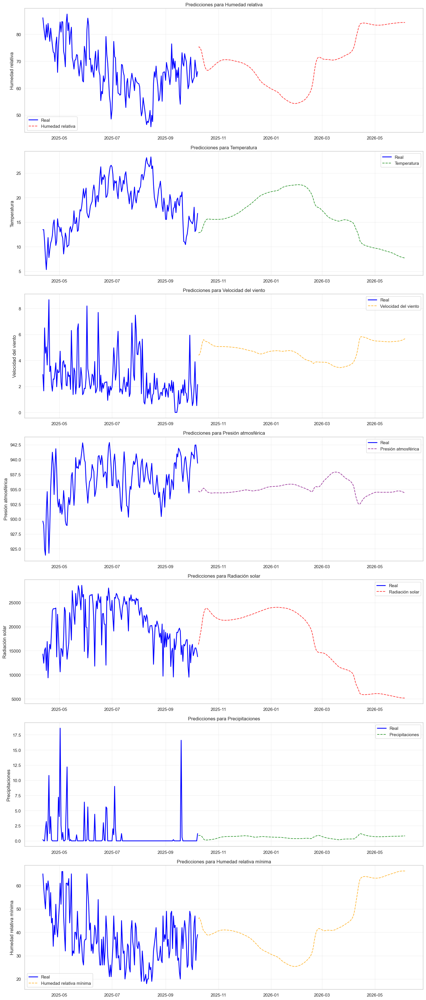

PREDICCIONES MODELO SARIMA: 
Datos cargados: 2472 observaciones, 7 variables
Rango temporal: 2019-01-02 00:00:00 a 2025-10-08 00:00:00


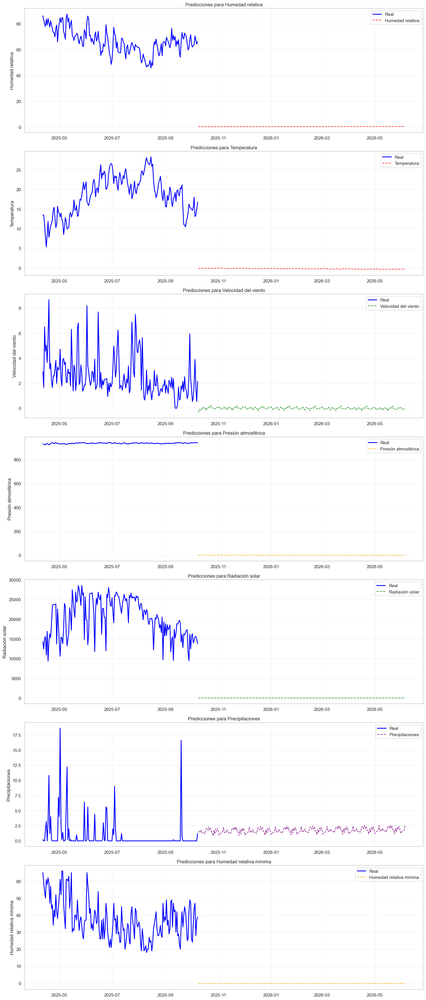

PREDICCIONES MODELO SARIMAX: 
Datos cargados: 2472 observaciones, 7 variables
Rango temporal: 2019-01-02 00:00:00 a 2025-10-08 00:00:00


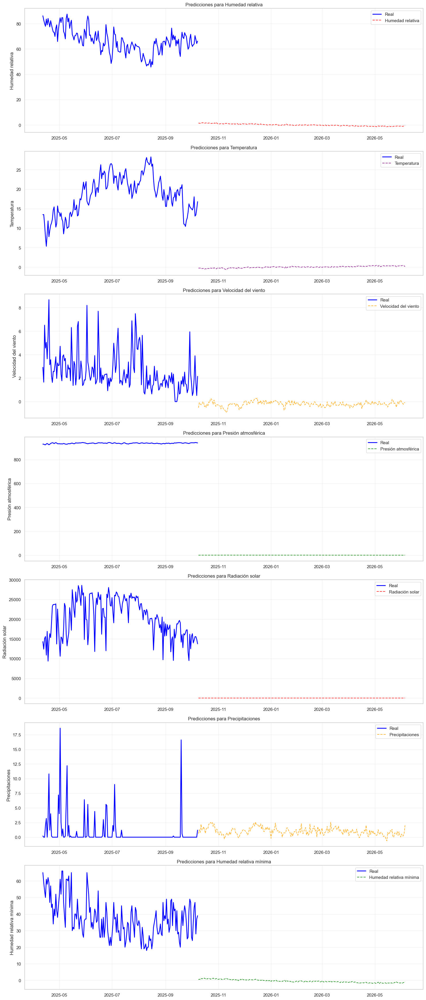

PREDICCIONES MODELO VAR: 
Datos cargados: 2472 observaciones, 7 variables
Rango temporal: 2019-01-02 00:00:00 a 2025-10-08 00:00:00


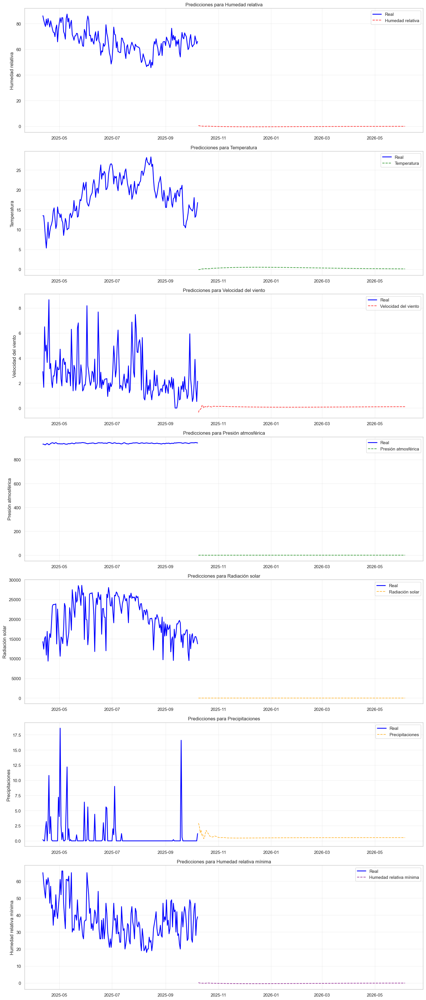

In [51]:
def plot_predictions(original_data: pd.DataFrame, predictions: Dict, 
                   variables: List[str] = None, n_last_points: int = 365):
    """Visualizar predicciones vs datos reales"""
    
    if variables is None:
        variables = original_data.columns
    
    fig, axes = plt.subplots(len(variables), 1, figsize=(15, 5*len(variables)))
    if len(variables) == 1:
        axes = [axes]
    
    for i, var in enumerate(variables):
        # Datos originales (últimos n puntos)
        recent_data = original_data[var].iloc[-n_last_points:]
        
        axes[i].plot(recent_data.index, recent_data.values, 
                    label='Real', linewidth=2, color='blue')
        
        # Predicciones de cada modelo
        colors = ['red', 'green', 'orange', 'purple']
        for j, (model_name, pred_dict) in enumerate(predictions.items()):
            if var in pred_dict.columns if isinstance(pred_dict, pd.DataFrame) else model_name.endswith(var):
                pred_series = pred_dict[var] if isinstance(pred_dict, pd.DataFrame) else pred_dict
                
                # Asegurar que las fechas coinciden
                if isinstance(pred_series, pd.Series):
                    start_date = recent_data.index[-1] + pd.Timedelta(days=1)
                    pred_dates = pd.date_range(start=start_date, periods=len(pred_series), freq='D')
                    
                    axes[i].plot(pred_dates, pred_series.values, 
                                label=model_name, linestyle='--', 
                                color=colors[j % len(colors)], alpha=0.8)
        
        axes[i].set_title(f'Predicciones para {var}')
        axes[i].set_ylabel(var)
        axes[i].legend()
        axes[i].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


lstm_predictions = load_predictions("lstm")
sarima_predictions = load_predictions("sarima")
sarimax_predictions = load_predictions("sarimax")
var_predictions = load_predictions("var")

# Ejemplo de uso:
print("PREDICCIONES MODELO LSTM: ")
plot_predictions(load_and_prepare_data(PHYSIC_DATA_PATH), lstm_predictions, n_last_points=180)

print("PREDICCIONES MODELO SARIMA: ")
plot_predictions(load_and_prepare_data(PHYSIC_DATA_PATH), sarima_predictions, n_last_points=180)

print("PREDICCIONES MODELO SARIMAX: ")
plot_predictions(load_and_prepare_data(PHYSIC_DATA_PATH), sarimax_predictions, n_last_points=180)

print("PREDICCIONES MODELO VAR: ")
plot_predictions(load_and_prepare_data(PHYSIC_DATA_PATH), var_predictions, n_last_points=180)

In [52]:
MODELO_ELEGIDO = lstm_predictions


<br>

---
<a id='seccion-6'></a>

#  Cálculo Necesidad de riego y aplicación RDC
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

<br>


<br>

---
<a id='6-1'></a>

## Cálculo de la ET0  (Evotranspiración de referencia)
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [53]:
def calculate_et0_fao_penman_monteith(df):
    """
    Calcula la Evapotranspiración de Referencia (ET0) usando la ecuación FAO Penman-Monteith
    """
    
    # Obtener datos del dataframe
    T = df['Temperatura']  # Temperatura media del aire [°C]
    RH = df['Humedad relativa']  # Humedad relativa [%]
    u2 = df['Velocidad del viento']  # Velocidad del viento a 2m [m/s]
    P = df['Presión atmosférica'] * 0.1  # Convertir hPa a kPa
    Rs = df['Radiación solar'] / 1e6  # Convertir J/m²/día a MJ/m²/día
    
    # 1. PRESIÓN DE VAPOR DE SATURACIÓN (es)
    # Fórmula: es = 0.6108 * exp(17.27 * T / (T + 237.3))
    es = 0.6108 * np.exp(17.27 * T / (T + 237.3))
    
    # 2. PRESIÓN DE VAPOR ACTUAL (ea)
    # Fórmula: ea = (RH/100) * es
    ea = es * RH / 100
    
    # 3. PENDIENTE DE LA CURVA DE PRESIÓN DE VAPOR (Δ)
    # Fórmula: Δ = 4098 * es / (T + 237.3)²
    delta = 4098 * es / (T + 237.3)**2
    
    # 4. CONSTANTE PSICROMÉTRICA (γ)
    # Fórmula: γ = 0.665 × 10⁻³ * P
    gamma = 0.665 * 1e-3 * P
    
    # 5. RADIACIÓN NETA (Rn) - Simplificada
    # Fórmula: Rn = 0.77 * Rs (asumiendo albedo 0.23)
    Rn = (1 - 0.23) * Rs
    
    # 6. FLUJO DE CALOR DEL SUELO (G) - Cero para periodos diarios
    G = 0
    
    # 7. ECUACIÓN FAO PENMAN-MONTEITH COMPLETA
    # Fórmula: 
    # ET0 = [0.408 * Δ * (Rn - G) + γ * (900/(T + 273)) * u2 * (es - ea)] / 
    #        [Δ + γ * (1 + 0.34 * u2)]
    
    numerador = (0.408 * delta * (Rn - G) + 
                gamma * (900 / (T + 273)) * u2 * (es - ea))
    
    denominador = delta + gamma * (1 + 0.34 * u2)
    
    et0 = numerador / denominador
    
    return et0

# Aplicar al dataframe
MODELO_ELEGIDO['ET0'] = calculate_et0_fao_penman_monteith(MODELO_ELEGIDO)

# Mostrar resultados
print("Resultados ET0:")
display(MODELO_ELEGIDO)


Resultados ET0:


,Humedad relativa,Temperatura,Velocidad del viento,Presión atmosférica,Radiación solar,Precipitaciones,Humedad relativa mínima,ET0
2025-04-12,75.225680,12.824626,4.414980,934.74460,16281.0080,0.834385,45.845673,1.257589
2025-04-13,75.295880,12.897439,4.428036,934.58340,17165.5450,0.908292,46.221250,1.260038
2025-04-14,74.808580,12.939791,4.555692,934.58570,18299.7150,0.894316,45.515476,1.310253
2025-04-15,74.216220,12.989694,4.880391,934.62720,19228.1780,0.817538,44.447453,1.401913
2025-04-16,73.022860,13.382570,5.205284,934.85800,20411.6200,0.720192,42.892647,1.549377
...,...,...,...,...,...,...,...,...
2025-12-03,84.357510,7.870454,5.543632,934.64514,5192.1370,0.791780,66.213880,0.729799
2025-12-04,84.361390,7.819257,5.568295,934.58830,5175.8250,0.800864,66.233470,0.729562
2025-12-05,84.361410,7.770551,5.597845,934.52155,5165.1826,0.809427,66.240960,0.729911
2025-12-06,84.361565,7.726124,5.632737,934.44630,5160.2974,0.817715,66.239030,0.730748


<a id='6-2'></a>


# Cálculo de la Curva Kc para Almendro Penta (FAO Papel 56)

[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


## 1. Identificar las Etapas de Crecimiento y sus Duraciones

### Divisiones del ciclo del cultivo:
- **Inicial (Lini)**: Brotación → 10% cobertura del suelo
- **Desarrollo (Ldev)**: Hasta cobertura máxima (70-80%)
- **Mediados (Lmid)**: Máxima cobertura y actividad fisiológica (floración → llenado de frutos)
- **Final (Llate)**: Inicio maduración → cosecha/caída de hojas

### Duraciones típicas (Tabla 11 - Deciduous Orchard):
| Etapa | Duración (días) |
|-------|-----------------|
| Inicial | 20-30 |
| Desarrollo | 70-90 |
| Mediados | 90-130 |
| Final | 30-60 |

**Nota**: Ajustar según:
- Localización geográfica y clima
- Observaciones locales de la variedad Penta
- Fechas de brotación y cosecha

## 2. Seleccionar Coeficientes de Cultivo de Referencia

### Valores base (Tabla 12 - Almonds, no ground cover):
 - Kc_ini = 0.40
- Kc_mid = 0.90
- Kc_end = 0.65


*Condiciones estándar: clima subhúmedo, viento moderado*

## 3. Ajustar Valores de Kc a Condiciones Locales

### Ajuste de Kc_ini:
- **Factores**: Frecuencia de mojado (lluvia/riego) y tipo de suelo
- **Herramientas**: Figuras 29 y 30
  - Intervalo entre riegos/lluvias
  - Textura del suelo (Fig. 30a: suelos gruesos, Fig. 30b: suelos finos/medios)

- **Riego parcial (ej. goteo) - Ecuación 60**:

kc_ini = fw × kc_ini(Fig)

donde `fw` = fracción de suelo mojado

### Ajuste de Kc_mid y Kc_end:
- **Ecuaciones 62 y 65**:

Kc_aj = Kc(Tab) + [0.04×(u₂ - 2) - 0.004×(RHmin - 45)] × (h/3)⁰·³



**Variables**:
- `u₂` = velocidad del viento [m/s]
- `RHmin` = humedad relativa mínima [%]
- `h` = altura del cultivo [m]

## 4. Construir la Curva de Kc

### Con valores ajustados y duraciones:
1. **Etapa inicial**: Línea horizontal en `Kc_ini`
2. **Etapa desarrollo**: Línea diagonal de `Kc_ini` → `Kc_mid`
3. **Etapa mediados**: Línea horizontal en `Kc_mid`
4. **Etapa final**: Línea diagonal de `Kc_mid` → `Kc_end`

**Resultado**: Curva lineal por segmentos que representa la evolución temporal del Kc

# Duración Estimada de las Etapas de Crecimiento del Almendro Penta

## Resumen de Etapas

| Etapa de Crecimiento | Duración Estimada | Explicación |
|---------------------|-------------------|-------------|
| **Inicial** | 15 días | - Desde brotación (28 feb, día 59) hasta floración (15 mar, día 74)<br>- Brotación ocurre 15 días antes de la floración |
| **Desarrollo** | 50 días | - Desde floración hasta cuajado de frutos y crecimiento vegetativo completo<br>- Penta es de vigor bajo pero de entrada en producción precoz |
| **Mediados** | 98 días | - Desde fin del desarrollo (4 may) hasta inicio de maduración (10 ago)<br>- Maduración temprana característica de la variedad |
| **Final** | 31 días | - Desde inicio de maduración (10 ago, día 222) hasta cosecha (10 sep, día 253) |

## Cálculo Detallado

### Fechas Clave
- **Floración**: 15 de marzo (día 74 del año)
- **Maduración**: 10 de septiembre (día 253) - 10 días antes que 'Ferragnès'
- **Brotación**: 28 de febrero (día 59) - 15 días antes de la floración
- **Cosecha**: 10 de septiembre (día 253)

### Período Total
**Desde brotación hasta cosecha**: 194 días (253 - 59 = 194)

### Distribución Temporal
1. **Inicial**: día 59 → 74 (15 días)
2. **Desarrollo**: día 74 → 124 (50 días, ~4 de mayo)
3. **Mediados**: día 124 → 222 (98 días, ~10 de agosto)
4. **Final**: día 222 → 253 (31 días)

## Factores Considerados

- **Vigor bajo y porte semi-abierto**: Puede alargar ligeramente la etapa de desarrollo
- **Precocidad productiva**: Sugiere crecimiento eficiente
- **Floración extra-tardía y maduración temprana**: Indican ciclo reproductivo corto
- **Autofecundación**: Asegura cuajada uniforme, apoyando transición rápida entre etapas

In [54]:
etapas_almendro = {
    "inicial": {
        "inicio": "3/1/2025",
        "fin": "3/15/2025",
        "kc_tabla": 0.4,
        "h": 5
    },
    "desarrollo": {
        "inicio": "3/16/2025",
        "fin": "5/4/2025", 
        "kc_tabla": np.nan,
        "h": 5
    },
    "medio": {
        "inicio": "5/5/2025",
        "fin": "8/10/2025",
        "kc_tabla": 0.9,
        "h": 5
    },
    "final": {
        "inicio": "8/11/2025",
        "fin": "9/10/2025",
        "kc_tabla": 0.65,
        "h": 5
    }
}

---
<a id='6-3'></a>

# Cálculo de Kc Inicial para Almendro Penta - Etapa Inicial
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


---


## Paso 1: Calcular el Intervalo Promedio entre Eventos de Mojado

### Eventos a considerar:
- Riegos y lluvias significativas (>3 mm por evento) durante la etapa inicial

### Fórmula de cálculo:

Intervalo_promedio = Duración_etapa_inicial / Número_eventos_mojado


### Ejemplo:
- Duración etapa inicial: 15 días
- Eventos de riego: 5
- **Intervalo promedio** = 15 / 5 = 3 días

In [55]:
def calculo_intervalo_promedio_eventos_mojado(df, fecha_inicio, fecha_fin):

    # Filtrar por rango de fechas y precipitación > 3 mm
    dias_lluvia = df[
        (df.index >= fecha_inicio) & 
        (df.index <= fecha_fin) & 
        (df['Precipitaciones'] > 3)
    ]

    # Contar los días
    cantidad_dias = len(dias_lluvia)

    return cantidad_dias

## Paso 2: Determinar la Profundidad de Infiltración Ajustada (I_w)

### Para riego por goteo - Ecuación 61:

I_w = I / f_w


**Donde:**
- `I` = Lámina de riego aplicada sobre área total del campo (mm/evento)
- `f_w` = Fracción de superficie mojada (goteo: 0.3 a 0.4)

### Ejemplo:
- `I` = 12 mm
- `f_w` = 0.4
- **I_w** = 12 / 0.4 = 30 mm


In [56]:
def calculo_profundidad_infiltracion(df, fecha_inicio, fecha_fin, f_w=0.4):
    
    # Filtrar por rango de fechas y precipitación > 3 mm
    dias_lluvia = df[
        (df.index >= fecha_inicio) & 
        (df.index <= fecha_fin) & 
        (df['Precipitaciones'] > 3)
    ]


    I_w = np.mean(dias_lluvia['Precipitaciones'] / f_w)

    return I_w


## Paso 3: Clasificar el Tipo de Evento de Mojado

### Basado en I_w:
| Tipo Evento | Rango I_w | Figura a usar |
|-------------|-----------|---------------|
| **Ligero** | I_w ≤ 10 mm | Figura 29 |
| **Pesado** | I_w ≥ 40 mm | Figura 30 (a o b) |
| **Intermedio** | 10 < I_w < 40 mm | Interpolar entre Figuras 29 y 30 |

**Selección Figura 30:**
- **Figura 30a**: Suelos gruesos (arenas y arenas francos)
- **Figura 30b**: Suelos finos/medios (francos, francos arcillosos, arcillas)

In [57]:
def clasificar_tipo_evento_mojado(df, fecha_inicio, fecha_fin):

    I_w_media = calculo_profundidad_infiltracion(df, fecha_inicio, fecha_fin)
        
    if I_w_media <= 10: 
        return "ligero"
    elif I_w_media > 10 and I_w_media < 40:
        return "intermedio" 
    elif I_w_media >= 40:
        return "pesado"
    



## Paso 4: Obtener Kc ini de las Figuras 29 o 30

### Parámetros requeridos:
- Intervalo de mojado (Paso 2)
- ETo promedio durante etapa inicial (mm/día)

### Procedimiento:
1. **Figura 29** (eventos ligeros): Leer Kc ini con intervalo y ETo
2. **Figura 30** (eventos pesados): Usar subfigura según tipo de suelo


**Interpolación (Ecuación 59):**
<div style="text-align: center;">
    <img src="img/Figure29.png" width="1000" alt="Figure29">
</div>

<br>

<div style="text-align: center;">
<img src="img/Figure30.png" width="1000" alt="Figure30">
</div>



In [58]:
def calculo_eto_etapa_inicial(df, fecha_inicio, fecha_fin):
    # Filtrar por rango de fechas y precipitación > 3 mm
    dias_etapa_inicial = df[
        (df.index >= fecha_inicio) & 
        (df.index <= fecha_fin) 
    ]

    return np.mean(calculate_et0_fao_penman_monteith(dias_etapa_inicial))


In [69]:
dias_promedio_evento_mojado = calculo_intervalo_promedio_eventos_mojado(MODELO_ELEGIDO, etapas_almendro["inicial"]["inicio"], etapas_almendro["inicial"]["fin"])
I = calculo_profundidad_infiltracion(MODELO_ELEGIDO, etapas_almendro["inicial"]["inicio"], etapas_almendro["inicial"]["fin"])
intesidad_evento_mojado = clasificar_tipo_evento_mojado(MODELO_ELEGIDO, etapas_almendro["inicial"]["inicio"], etapas_almendro["inicial"]["fin"])
eto_etapa_inicial = calculo_eto_etapa_inicial(MODELO_ELEGIDO, etapas_almendro["inicial"]["inicio"], etapas_almendro["inicial"]["fin"])

intesidad_evento_mojado = "ligero"
eto_etapa_inicial = 1.5

print(dias_promedio_evento_mojado)
print(intesidad_evento_mojado)
print(eto_etapa_inicial)

0
ligero
1.5


> Tenemos que interpolar el dato de la figura 29 y de la 30b al ser eventos mojados intermedios 



<img src="img/formula_ajuste_kc_ini.png" width="1000" alt="formula_ajuste_kc_ini">


In [70]:
kc_ini_fig29 = 1.2
kc_ini_fig30 = 1.2


kc_ini_figure = kc_ini_fig29 + ((I - 10) / (40 - 10)) * (kc_ini_fig30 - kc_ini_fig29)

print(kc_ini_figure)


nan


## Paso 5: Ajustar por Mojado Parcial (Riego por Goteo)

### Ecuación 60:


Kc_ini = f_w × Kc_ini(Fig)


In [71]:

f_w = 0.4


kc_ini = f_w *kc_ini_figure

print(kc_ini)

nan


## Paso 6: Consideraciones Específicas para Almendros

### Cobertura del suelo:
| Condición | Rango Kc ini |
|-----------|--------------|
| Con cubierta vegetal | 0.8 - 0.9 |
| Suelo desnudo, mojado infrecuente | 0.3 - 0.4 |

### Estado del árbol (almendros deciduos):
- **Suelo seco sin mojar**: Kc ini = 0.3 - 0.4
- **Riego frecuente/lluvia**: Ajustar valores al alza

**Nota:** Para variedad Penta, considerar condiciones específicas pre-brotación

---
<a id='6-4'></a>

# Cálculo Kc mid
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


---

## Paso 1: Obtener el Valor Básico de Kc mid

Consulta la tabla de referencia para encontrar el valor de Kc mid para tu cultivo específico.

**Ejemplo para almendro:**
- Kc mid = 0.90 (para "Almonds, no ground cover")
- Altura del cultivo (h) = 5 m

## Paso 2: Recopilar Datos Climáticos Locales

Necesitas dos parámetros climáticos promediados para la etapa de mediados:

### a) Velocidad del viento (u₂)
- Media diaria del viento a 2 m sobre pasto [m/s]
- Rango válido: 1 m/s ≤ u₂ ≤ 6 m/s

### b) Humedad relativa mínima (RHmin)
- Media diaria de la humedad relativa mínima [%]
- Rango válido: 20% ≤ RHmin ≤ 80%


## Paso 3: Aplicar la Ecuación de Ajuste

Usa la ecuación para ajustar Kc mid:
Kc_mid_ajustado = Kc_mid_tabla + [0.04 × (u₂ − 2) − 0.004 × (RHmin − 45)] × (h/3)^0.3

![formula_kc_mid.png](img/formula_kc_mid.png)

## Paso 4: Ajuste por Frecuencia de Riego

Si riegas frecuentemente (más de cada 3 días) y:
- Kc mid de tabla < 1.0
- Fracción de suelo mojado (fw) > 0.3

Puedes aumentar Kc mid a 1.1-1.3 para considerar:
- Suelo continuamente húmedo
- Evaporación por interceptación (riego por aspersión)
- Rugosidad de la vegetación

## Paso 5: Verificar Límites de Aplicación

- Altura del cultivo: 0.1 m < h < 10 m
- Viento: 1 m/s ≤ u₂ ≤ 6 m/s
- Humedad: 20% ≤ RHmin ≤ 80%

*Si h < 0.1 m, NO apliques la ecuación (se comporta como referencia de pasto)*


In [72]:
def calcular_kc_ajustado(df, fecha_inicio, fecha_fin, kc_tabla, h=5, verbose=True):
    """
    Calcula el Kc ajustado para un período específico
    
    Parámetros:
    - df: DataFrame con los datos diarios
    - fecha_inicio: fecha de inicio del período (string)
    - fecha_fin: fecha de fin del período (string)
    - kc_tabla: valor de Kc de tabla para el período
    - h: altura del cultivo (default=5)
    - verbose: si True, muestra los valores intermedios
    
    Retorna:
    - kc_ajustado: valor de Kc ajustado
    """
    # Convertir fechas a datetime
    fecha_inicio = pd.to_datetime(fecha_inicio)
    fecha_fin = pd.to_datetime(fecha_fin)
    
    # Filtrar por rango de fechas
    df_periodo = df[
        (df.index >= fecha_inicio) & 
        (df.index <= fecha_fin)
    ]
    
    # Verificar que hay datos en el período
    if df_periodo.empty:
        raise ValueError(f"No hay datos disponibles para el período {fecha_inicio} a {fecha_fin}")
    
    # Calcular datos climáticos locales
    velocidad_viento_media = np.mean(df_periodo["Velocidad del viento"])
    humedad_relativa_minima_media = np.mean(df_periodo["Humedad relativa mínima"])
    
    # Ecuación de ajuste
    kc_ajustado = kc_tabla + (0.04 * (velocidad_viento_media - 2) - 0.0004 * (humedad_relativa_minima_media - 45)) * ((h / 3)**0.3)
    
    if verbose:
        print(f"Período: {fecha_inicio.strftime('%d/%m/%Y')} - {fecha_fin.strftime('%d/%m/%Y')}")
        print(f"Velocidad del viento media: {velocidad_viento_media:.2f}")
        print(f"Humedad relativa mínima media: {humedad_relativa_minima_media:.2f}")
        print(f"Kc ajustado: {kc_ajustado:.3f}")
        print("-" * 50)
    
    return kc_ajustado


In [73]:
# Calcular Kc mid
kc_mid = calcular_kc_ajustado(
    df=MODELO_ELEGIDO,
    fecha_inicio=etapas_almendro["medio"]["inicio"],
    fecha_fin= etapas_almendro["medio"]["fin"],
    kc_tabla=0.9,
    h=5
)


Período: 05/05/2025 - 10/08/2025
Velocidad del viento media: 4.76
Humedad relativa mínima media: 33.66
Kc ajustado: 1.034
--------------------------------------------------


# Guía para Calcular Kc end 

<a id='6-5'></a>

[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


## Paso 1: Obtener el Valor Básico de Kc end

Consulta la tabla de referencia para encontrar el valor de Kc end para tu cultivo específico.

**Ejemplo para almendro:**
- Kc end = 0.65
- Altura del cultivo (h) = 5 m

## Paso 2: Verificar si Aplica el Ajuste Climático

### Condición CRUCIAL:

- **SI** Kc end (Tabla) > 0.45 → **APLICA** la ecuación de ajuste
- **SI** Kc end (Tabla) ≤ 0.45 → **NO apliques** ajuste (Kc end = Kc end Tabla)

## Paso 3: Recopilar Datos Climáticos para Etapa Final

Necesitas datos promediados para la etapa de final de temporada:

### a) Velocidad del viento (u₂)
- Media diaria del viento a 2 m sobre pasto [m/s]
- Rango válido: 1 m/s ≤ u₂ ≤ 6 m/s

### b) Humedad relativa mínima (RHmin)
- Media diaria de la humedad relativa mínima [%]
- Rango válido: 20% ≤ RHmin ≤ 80%

### c) Altura del cultivo (h)
- Altura media durante la etapa final [m]
- Rango válido: 0.1 m ≤ h ≤ 10 m

## Paso 4: Aplicar la Ecuación de Ajuste (si corresponde)

![formula_kc_end.png](img/formula_kc_end.png)



## Paso 5: Considerar el Manejo de Cosecha y Riego

### Factor DECISIVO en Kc end:

#### Cosecha en verde (alto Kc end):
- Riego frecuente hasta cosecha
- Suelo y vegetación permanecen húmedos
- Kc end será relativamente alto

#### Cosecha en seco (bajo Kc end):
- Riego reducido o suspendido antes de cosecha
- Suelo y vegetación se secan
- Kc end será relativamente bajo

**Para cultivos de maduración temprana:**
- Probablemente cosecha en condiciones más secas
- Kc end podría ser menor que el valor de tabla

In [74]:
# Calcular Kc end
kc_end = calcular_kc_ajustado(
    df=MODELO_ELEGIDO,
    fecha_inicio=etapas_almendro["final"]["inicio"],
    fecha_fin=etapas_almendro["final"]["fin"],
    kc_tabla=0.65,
    h=5
)

Período: 11/08/2025 - 10/09/2025
Velocidad del viento media: 3.91
Humedad relativa mínima media: 35.74
Kc ajustado: 0.743
--------------------------------------------------


<br>

---
<a id='6-6'></a>

## Construcción de la gráfica de Kc a lo largo de las diferentes etapas
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

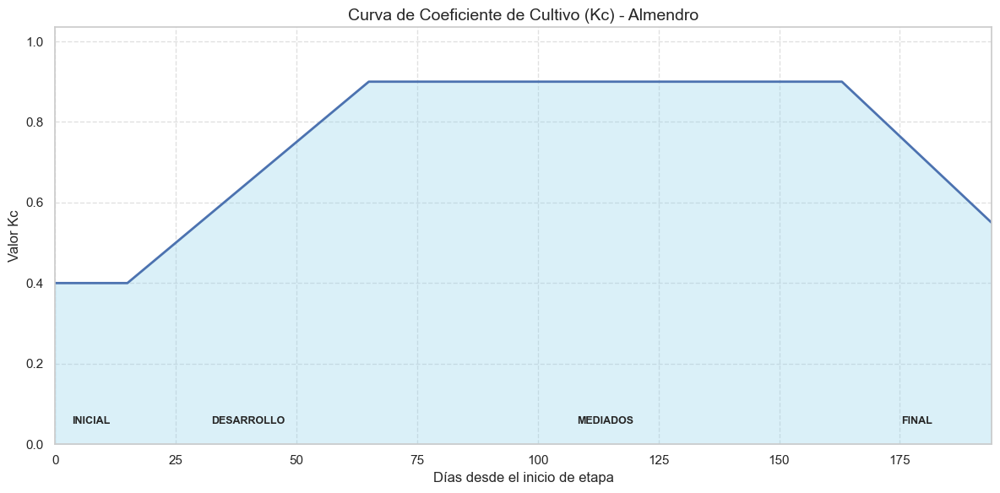

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# --- VALORES HARDCODEADOS (Para asegurar que la gráfica funcione) ---
kc_ini = 0.40
kc_mid = 0.90
kc_end = 0.55

# Duración de las etapas (días)
L_ini, L_dev, L_mid, L_late = 15, 50, 98, 31

# Puntos de transición
dia_fin_ini = L_ini
dia_fin_dev = L_ini + L_dev
dia_fin_mid = L_ini + L_dev + L_mid
dia_fin_late = L_ini + L_dev + L_mid + L_late

# Crear arrays
dias = np.arange(0, dia_fin_late + 1)
Kc_values = np.zeros_like(dias, dtype=float)

def calcular_Kc(dia):
    if dia <= dia_fin_ini:
        return kc_ini
    elif dia <= dia_fin_dev:
        # Usamos max(1, L_dev) para evitar división por cero accidental
        progreso = (dia - dia_fin_ini) / max(1, L_dev)
        return kc_ini + progreso * (kc_mid - kc_ini)
    elif dia <= dia_fin_mid:
        return kc_mid
    elif dia <= dia_fin_late:
        progreso = (dia - dia_fin_mid) / max(1, L_late)
        return kc_mid + progreso * (kc_end - kc_mid)
    else:
        return kc_end

# Llenar el array
for i, dia in enumerate(dias):
    Kc_values[i] = calcular_Kc(dia)

# --- CORRECCIÓN DEL ERROR DE LÍMITES ---
# Si max() falla por NaNs, usamos un valor por defecto
try:
    y_max = np.nanmax(Kc_values) * 1.15
    if np.isnan(y_max) or np.isinf(y_max):
        y_max = 1.2
except:
    y_max = 1.2

plt.figure(figsize=(12, 6))
plt.plot(dias, Kc_values, 'b-', linewidth=2, label='Curva de Kc')

# Rellenar el área bajo la curva para mejor visualización
plt.fill_between(dias, Kc_values, color='skyblue', alpha=0.3)

# Configuración de ejes y etiquetas
plt.ylim(0, y_max)
plt.xlim(0, dia_fin_late)
plt.grid(True, linestyle='--', alpha=0.6)
plt.title('Curva de Coeficiente de Cultivo (Kc) - Almendro', fontsize=14)
plt.xlabel('Días desde el inicio de etapa')
plt.ylabel('Valor Kc')

# Añadir nombres de las etapas en el gráfico
nombres = ['INICIAL', 'DESARROLLO', 'MEDIADOS', 'FINAL']
centros = [dia_fin_ini/2, (dia_fin_ini+dia_fin_dev)/2, 
           (dia_fin_dev+dia_fin_mid)/2, (dia_fin_mid+dia_fin_late)/2]

for x, nombre in zip(centros, nombres):
    plt.text(x, 0.05, nombre, ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

<br>

---
<a id='6-7'></a>

## Cálculo ETc (Evotranspiración específica)
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

In [80]:
# Calcular ETc para un día específico 
def calcular_ETc(dia, ETo):
    """Calcula ETc para un día específico dado ETo"""
    kc = calcular_Kc(dia)
    return kc * ETo

MODELO_ELEGIDO["dia"] = MODELO_ELEGIDO.index.dayofyear

MODELO_ELEGIDO["ETc"] = MODELO_ELEGIDO.apply(lambda fila: calcular_ETc(fila["dia"], fila["ET0"]), axis=1)

pd.set_option('display.max_rows', None)
display(MODELO_ELEGIDO)

,Humedad relativa,Temperatura,Velocidad del viento,Presión atmosférica,Radiación solar,Precipitaciones,Humedad relativa mínima,ET0,dia,ETc
2025-04-12,75.225680,12.824626,4.414980,934.74460,16281.0080,0.834385,45.845673,1.257589,102,1.131830
2025-04-13,75.295880,12.897439,4.428036,934.58340,17165.5450,0.908292,46.221250,1.260038,103,1.134035
2025-04-14,74.808580,12.939791,4.555692,934.58570,18299.7150,0.894316,45.515476,1.310253,104,1.179228
2025-04-15,74.216220,12.989694,4.880391,934.62720,19228.1780,0.817538,44.447453,1.401913,105,1.261722
2025-04-16,73.022860,13.382570,5.205284,934.85800,20411.6200,0.720192,42.892647,1.549377,106,1.394440
2025-04-17,71.347664,13.933340,5.504819,935.10230,21788.5500,0.526623,41.436886,1.739476,107,1.565528
2025-04-18,69.957726,14.447010,5.597008,935.20390,22693.9940,0.304877,40.672836,1.880321,108,1.692289
2025-04-19,68.477646,14.913964,5.534817,935.08380,23365.8930,0.171399,40.233200,1.996666,109,1.796999
2025-04-20,67.505750,15.225428,5.483214,934.93430,23702.3550,0.116096,39.831080,2.071840,110,1.864656
2025-04-21,66.894300,15.508081,5.445480,934.73535,23820.6680,0.139131,39.257690,2.125155,111,1.912639


<br>

---
<a id='6-8'></a>

## Cálculo Necesidad de Riego
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]


Para transformar el dato de **ETc** (Evapotranspiración del cultivo) en una cantidad de agua aplicable mediante el sistema de riego, seguiremos este proceso de tres pasos:

---

### 1. Cálculo de las Necesidades Netas ($NN$)
El objetivo es reponer el agua consumida por el árbol, descontando la aportación natural de la lluvia.

$$NN = ETc - P_e$$

* **$ETc$**: Evapotranspiración del cultivo calculada (mm/día).
* **$P_e$ (Precipitación efectiva)**: Agua de lluvia que realmente aprovecha el cultivo. Se suele estimar como el **75% - 80%** de la precipitación registrada (siempre que esta sea $> 5$ mm).

---

### 2. Ajuste por Eficiencia de Riego: Necesidades Brutas ($NB$)
Debido a las pérdidas por evaporación o lixiviación, debemos aplicar más agua de la que el árbol consume estrictamente. Dividimos las necesidades netas por el coeficiente de eficiencia ($E_a$):

$$NB = \frac{NN}{E_a}$$

**Valores típicos de eficiencia ($E_a$):**
* **Goteo**: $0.90$ - $0.95$
* **Microaspersión**: $0.80$ - $0.85$

---

### 3. Conversión a Litros por Árbol (A falta de datos, no llevaremos a cabo el siguiente cálculo, pero se especifica por si en un futuro se implementa)
La $ETc$ se expresa en $mm$, lo que equivale a $l/m^2$. Para obtener el volumen por planta, multiplicamos por el marco de plantación y el coeficiente de sombreado.

**Fórmula:**
$$Litros = ETc \times \text{Marco de plantación} \times K_r$$

* **Marco de plantación**: Superficie asignada a cada árbol (ej. $6m \times 7m = 42m^2$).
* **$K_r$ (Coeficiente de sombreado)**: Ajuste para árboles jóvenes. Si el árbol es adulto y cubre gran parte del marco, se usa $1$. Si es joven, se calcula en función del diámetro de la copa para evitar regar suelo desnudo.

> **Ejemplo práctico:**
> Para una $ETc$ de $5$ mm en un marco de $6 \times 7$ m ($42 m^2$):
> $5 \text{ mm} \times 42 \text{ m}^2 = 210 \text{ litros/árbol al día.}$

In [81]:
# --- Configuración de parámetros ---
EFICIENCIA_RIEGO = 0.95  # Ajustar según sistema (0.95 para goteo)
COEF_PRECIPITACION = 0.75 # Porcentaje de lluvia aprovechable (75%)

# Definimos la Precipitación Efectiva (Pe)
# Se suele considerar efectiva si la lluvia supera un umbral mínimo (3 mm), como indica la FAO-56
def calcular_pe(precipitacion):
    if precipitacion > 3:
        return precipitacion * COEF_PRECIPITACION
    return 0

MODELO_ELEGIDO["Pe"] = MODELO_ELEGIDO["Precipitaciones"].apply(calcular_pe)

# Calculamos Necesidades Netas (NN = ETc - Pe)
MODELO_ELEGIDO["NN"] = (MODELO_ELEGIDO["ETc"] - MODELO_ELEGIDO["Pe"]).clip(lower=0)

# Calculamos Necesidades Brutas (NB = NN / Eficiencia)
MODELO_ELEGIDO["NB"] = MODELO_ELEGIDO["NN"] / EFICIENCIA_RIEGO

# Visualizar resultados
display(MODELO_ELEGIDO[["Precipitaciones", "ETc", "Pe", "NN", "NB"]].head())

,Precipitaciones,ETc,Pe,NN,NB
2025-04-12,0.834385,1.131830,0,1.131830,1.191400
2025-04-13,0.908292,1.134035,0,1.134035,1.193721
2025-04-14,0.894316,1.179228,0,1.179228,1.241292
2025-04-15,0.817538,1.261722,0,1.261722,1.328128
2025-04-16,0.720192,1.394440,0,1.394440,1.467831


<br>

---
<a id='6-9'></a>

## Cálculo Riego Deficitario Controlado 
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

Basado en las investigaciones especificadas en el apartado 5 de la memoria complementaria de este proyecto. Aplicaremos una estrategia de **RDC** durante la etapa de **Mediados** (específicamente en su segunda fase). 

---

### Justificación Técnica
Según la bibliografía consultada, el almendro presenta una resistencia diferenciada al estrés hídrico dependiendo de su estado fenológico:

1.  **Periodo Crítico:** Floración, cuajado y llenado rápido del grano. En estas fases, el déficit hídrico penaliza severamente la cosecha.
2.  **Periodo de Resistencia (Fase II de Mediados):** Coincide con el **endurecimiento de la cáscara**. Durante este intervalo, el crecimiento del embrión es lento, lo que permite reducir drásticamente el aporte de agua sin afectar significativamente el peso final de la pepita o la inducción floral del año siguiente.

### Implementación del Estrés Hídrico
Se ha definido un nivel de **estrés del 80%** (reducción del 80% de la ETc), lo que significa que el árbol recibirá únicamente el **20% de sus necesidades hídricas teóricas**.

**Fórmula de aplicación para el periodo RDC:**

$$ETc_{RDC} = ETc \times 0.20$$


> **Nota de aplicación:** Esta reducción se aplicará exclusivamente en la ventana temporal detectada (22 de junio al 10 de agosto) tras el endurecimiento de la cáscara y antes del inicio de la maduración (periodo crítico de post-cosecha).

In [82]:
# Calculamos ETc_RDC y lo aplicamos al dataframe en su propia columna
MODELO_ELEGIDO["ETc_RDC"] = MODELO_ELEGIDO.apply(lambda fila: calcular_ETc(fila["dia"], fila["ET0"]) * 0.2, axis=1)

# Calculamos Necesidades Netas (NN = ETc - Pe)
MODELO_ELEGIDO["NN_RDC"] = (MODELO_ELEGIDO["ETc_RDC"] - MODELO_ELEGIDO["Pe"]).clip(lower=0)

# Calculamos Necesidades Brutas (NB = NN / Eficiencia)
MODELO_ELEGIDO["NB_RDC"] = MODELO_ELEGIDO["NN_RDC"] / EFICIENCIA_RIEGO

# Visualizar resultados
display(MODELO_ELEGIDO[["Precipitaciones", "ETc_RDC", "Pe", "NN_RDC", "NB_RDC"]].head())

,Precipitaciones,ETc_RDC,Pe,NN_RDC,NB_RDC
2025-04-12,0.834385,0.226366,0,0.226366,0.238280
2025-04-13,0.908292,0.226807,0,0.226807,0.238744
2025-04-14,0.894316,0.235846,0,0.235846,0.248258
2025-04-15,0.817538,0.252344,0,0.252344,0.265626
2025-04-16,0.720192,0.278888,0,0.278888,0.293566


---

#### Gráficas comparativas: Impacto de la Estrategia RDC

---

<br>

A continuación, se presentan dos visualizaciones clave para evaluar la viabilidad de la estrategia de **Riego Deficitario Controlado (RDC)** aplicada durante la segunda fase de la etapa de "Mediados".

1.  **Dinámica Temporal de Riego**: En la primera gráfica comparamos la evolución diaria de las **Necesidades Brutas (NB)**. Esto permite identificar visualmente el "ahorro" diario de agua y observar cómo la transpiración del cultivo se ve recortada drásticamente durante el periodo de estrés controlado (junio-agosto).

2.  **Balance Hídrico Acumulado**: El gráfico de barras cuantifica el impacto total de la estrategia en términos de volumen. Convertimos los milímetros acumulados a **metros cúbicos por hectárea ($m^3/ha$)**.


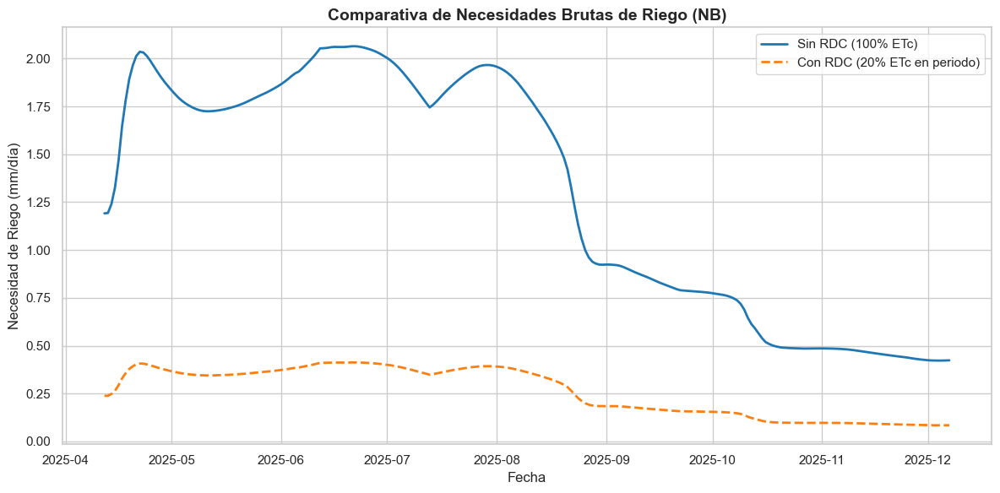

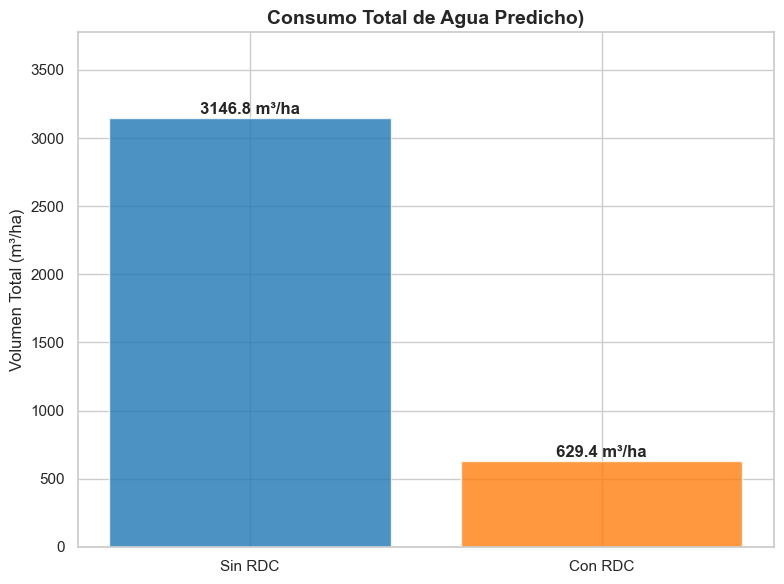

In [84]:
# Configuración de estilo
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# --- 1. Gráfica Comparativa de Evolución Temporal ---
plt.figure()
plt.plot(MODELO_ELEGIDO.index, MODELO_ELEGIDO['NB'], label='Sin RDC (100% ETc)', color='tab:blue', linewidth=2)
plt.plot(MODELO_ELEGIDO.index, MODELO_ELEGIDO['NB_RDC'], label='Con RDC (20% ETc en periodo)', color='tab:orange', linestyle='--', linewidth=2)

plt.title('Comparativa de Necesidades Brutas de Riego (NB)', fontsize=14, fontweight='bold')
plt.xlabel('Fecha')
plt.ylabel('Necesidad de Riego (mm/día)')
plt.legend()
plt.tight_layout()
plt.show()

# --- 2. Gráfico de Barras: Consumo Total Acumulado ---
# Calculamos el total (sumando mm)
total_sin_rdc = MODELO_ELEGIDO['NB'].sum()
total_con_rdc = MODELO_ELEGIDO['NB_RDC'].sum()

# Opcional: Convertir mm a m3/ha (1 mm = 10 m3/ha)
labels = ['Sin RDC', 'Con RDC']
totales_m3 = [total_sin_rdc * 10, total_con_rdc * 10]
ahorro = ((total_sin_rdc - total_con_rdc) / total_sin_rdc) * 100

plt.figure(figsize=(8, 6))
bars = plt.bar(labels, totales_m3, color=['tab:blue', 'tab:orange'], alpha=0.8)

# Añadir etiquetas de valor sobre las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 10, f'{round(yval, 1)} m³/ha', ha='center', va='bottom', fontweight='bold')

plt.title(f'Consumo Total de Agua Predicho)', fontsize=14, fontweight='bold')
plt.ylabel('Volumen Total (m³/ha)')
plt.ylim(0, max(totales_m3) * 1.2) # Espacio para la etiqueta
plt.tight_layout()
plt.show()

<br>

---
<a id='seccion-7'></a>

# 7. Conclusiones
[ <small style="font-size: 20px;">[📑 Volver al índice](#top)</small> ]

---

<br>

El proyecto ha desarrollado con éxito la integración de **minería de datos y estrategias de Riego Deficitario Controlado (RDC)** en el cultivo intensivo del almendro. Se ha logrado transformar datos brutos de sensores en una herramienta de decisión capaz de optimizar el consumo de agua en el cultivo del almendro.

A pesar de la correcta implementación técnica, la precisión de las predicciones se vio condicionada por la **capacidad limitada de hardware** para procesar ciclos anuales completos y la **escasez de datos históricos**. 

## Líneas de trabajo futuras

### Integración en la Universidad de Burgos (UBU)

Se plantea integrar el motor de predicción desarrollado como un **módulo especializado** dentro de las plataformas agrícolas que estan desarrollando proyectos en colaboración con la **UBU**. Esto permitirá que el algoritmo de RDC opere sobre infraestructuras consolidadas, beneficiándose de una gestión de datos preexistente mientras aporta su capacidad analítica específica.

### Otras lineas de trabajo futuras sobre el propio ecosistema:

1. **Meteorología en tiempo real:** Integrar la API de **AEMET** para ajustar el riego según previsiones de lluvia.
2. **Arquitectura Multicultivo:** Flexibilizar el sistema para adaptarse a diferentes fincas y variedades agrícolas.
3. **Computación de alto rendimiento:** Migrar el entrenamiento a un **clúster distribuido** para procesar series temporales extensas.
4. **Edge Computing:** Implementar el modelo en dispositivos locales para la **automatización directa** del riego.
5. **IA Explicativa:** Incorporar modelos que generen recomendaciones contextualizadas en lenguaje natural.

